In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
from scipy.stats import shapiro, levene, kruskal, sem, f_oneway
from sklearn.utils import resample
import random
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import statsmodels.api as sm
import statsmodels.formula.api as smf
from sklearn.preprocessing import StandardScaler
from scipy.stats import kruskal, spearmanr
from sklearn.model_selection import LeaveOneOut
from sklearn.metrics import mean_absolute_error
import warnings
import pymc as pm
import arviz as az

WARNING (pytensor.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


In [3]:
#Read the dataset and drop NaN values

dataset = 'merged_filtered_data.csv'
filtered_data = pd.read_csv(dataset)
filtered_data.dropna(inplace=True)

filtered_data

,session,trialno,difficulty,accuracy,sideChosen,durExplorationPeriod,durDecisionPeriod,durPeriodTotal,SwitchesExplorationPeriod,SwitchesDecisionPeriod,...,FixNbDecisionPeriod,FixNb,FixNbInTDecision,FixNbInLExploration,FixNbInRExploration,FixNbBottomExploration,LookDurInTDecision,LookDurInLExploration,LookDurInRExploration,LookDurBottomExploration
0,curE002a,8,Easy,0.0,left,11270,924,12194,6,0,...,2,22,1,13,5,18,1208,4404,1076,5480
1,curE002a,9,Easy,1.0,left,2498,2182,4680,2,0,...,4,10,3,3,2,5,2176,1036,634,1670
2,curE002a,10,Easy,1.0,right,9912,2914,12826,3,1,...,6,17,3,3,5,8,2020,754,1904,2658
3,curE002a,11,Medium,1.0,right,2328,1582,3910,2,1,...,5,10,3,2,1,3,1780,584,410,994
4,curE002a,12,Medium,0.0,left,14272,984,15256,5,1,...,3,26,1,14,7,21,1296,4854,2700,7554
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1025,curE122a,27,Medium,1.0,left,13092,1598,14690,2,0,...,5,25,4,15,3,18,1484,8504,894,9398
1026,curE122a,28,Medium,1.0,right,13796,566,14362,3,1,...,2,24,0,5,16,21,288,1178,5768,6946
1027,curE122a,35,Hard,1.0,left,16894,1432,18326,5,0,...,0,38,0,22,15,37,118,6830,4860,11690
1028,curE122a,38,Hard,1.0,left,2414,582,2996,2,1,...,2,7,0,2,1,3,502,1316,270,1586


In [4]:
#Creating Consecutive Trials Dataset and adding Prior Accuracy column
filtered_data.sort_values(by=['session', 'trialno'], inplace=True)

mask = (
    (filtered_data['trialno'].shift(1) == filtered_data['trialno'] - 1) |  # Check if the trialno is preceded by the previous trialno
    (filtered_data['trialno'].shift(-1) == filtered_data['trialno'] + 1) | # Check if the trialno is followed by a consecutive trialno
    (filtered_data['trialno'].shift(1).isna()) |               # Check if the trialno has no previous trialno
    (filtered_data['trialno'].shift(-1).isna())                # Check if the trialno has no following trialno
)

data = filtered_data[mask]

data['prior_accuracy'] = data.groupby('session')['accuracy'].shift(1)

data.loc[~(data['trialno'] - 1 == data['trialno'].shift(1)), 'prior_accuracy'] = float('NaN')

data.reset_index(drop=True, inplace=True)

data = data.drop(data.index[-1])

data

C:\Users\I587504\AppData\Local\Temp\ipykernel_85508\1686750277.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['prior_accuracy'] = data.groupby('session')['accuracy'].shift(1)


,session,trialno,difficulty,accuracy,sideChosen,durExplorationPeriod,durDecisionPeriod,durPeriodTotal,SwitchesExplorationPeriod,SwitchesDecisionPeriod,...,FixNb,FixNbInTDecision,FixNbInLExploration,FixNbInRExploration,FixNbBottomExploration,LookDurInTDecision,LookDurInLExploration,LookDurInRExploration,LookDurBottomExploration,prior_accuracy
0,curE002a,8,Easy,0.0,left,11270,924,12194,6,0,...,22,1,13,5,18,1208,4404,1076,5480,NaN
1,curE002a,9,Easy,1.0,left,2498,2182,4680,2,0,...,10,3,3,2,5,2176,1036,634,1670,0.0
2,curE002a,10,Easy,1.0,right,9912,2914,12826,3,1,...,17,3,3,5,8,2020,754,1904,2658,1.0
3,curE002a,11,Medium,1.0,right,2328,1582,3910,2,1,...,10,3,2,1,3,1780,584,410,994,1.0
4,curE002a,12,Medium,0.0,left,14272,984,15256,5,1,...,26,1,14,7,21,1296,4854,2700,7554,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
850,curE122a,16,Easy,0.0,left,6080,1298,7378,1,0,...,17,2,7,3,10,1974,3370,790,4160,1.0
851,curE122a,25,Easy,1.0,left,2714,8398,11112,1,0,...,16,8,3,0,3,4450,718,2,720,NaN
852,curE122a,26,Medium,0.0,left,2378,566,2944,1,1,...,6,0,3,0,3,570,1160,0,1160,1.0
853,curE122a,27,Medium,1.0,left,13092,1598,14690,2,0,...,25,4,15,3,18,1484,8504,894,9398,0.0


In [42]:
#data = pd.DataFrame(data)

# Save DataFrame to CSV
#data.to_csv('data_with_prior_accuracy.csv', index=False)

Shapiro-Wilk test for 0.0: p-value = 4.932345969341196e-17
Shapiro-Wilk test for 1.0: p-value = 5.3769488935931555e-14
Levene's test for homogeneity of variances: p-value = nan
Kruskal-Wallis test:
H-statistic: nan
p-value: nan
Mean Look Duration of Exploration by Prior Accuracy:
prior_accuracy
0.0    3271.805755
1.0    3229.544379
Name: LookDurBottomExploration, dtype: float64
SEM Look Duration of Exploration by Prior Accuracy:
prior_accuracy
0.0    169.392575
1.0    142.444550
Name: LookDurBottomExploration, dtype: float64


C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


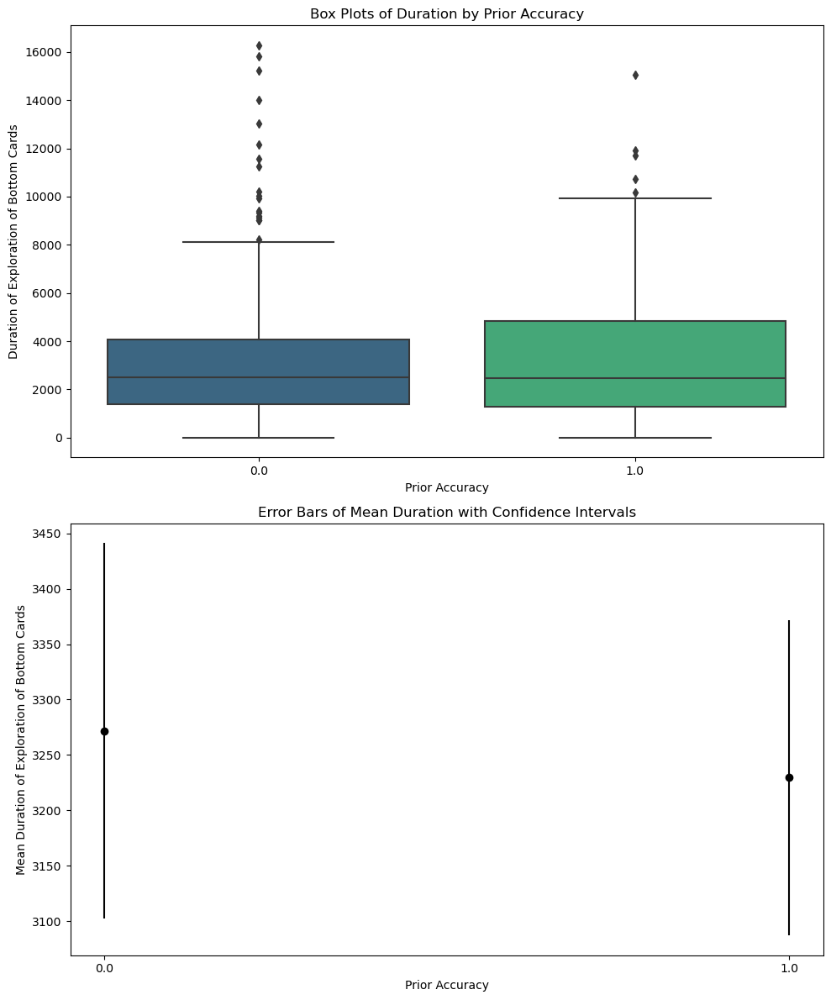

In [5]:
# How long infants take to explore the bottom cards by prior accuracy 

LookDurBottomExploration_by_prior_accuracy = [data[data['prior_accuracy'] == level]['LookDurBottomExploration'] for level in data['prior_accuracy'].unique()]
LookDurBottomExploration_by_prior_accuracy = [group.dropna() for group in LookDurBottomExploration_by_prior_accuracy]

# Shapiro-Wilk test for normality
for group_name, group_data in data.groupby('prior_accuracy')['LookDurBottomExploration']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")
    
# Levene's test for homogeneity of variances
stat, p = levene(*LookDurBottomExploration_by_prior_accuracy)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test
H, p = kruskal(*LookDurBottomExploration_by_prior_accuracy)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of exploration of bottom cards duration by accuracy
mean_gazeduration_by_prior_accuracy = data.groupby('prior_accuracy')['LookDurBottomExploration'].mean()
sem_gazeduration_by_prior_accuracy = data.groupby('prior_accuracy')['LookDurBottomExploration'].sem()
print("Mean Look Duration of Exploration by Prior Accuracy:")
print(mean_gazeduration_by_prior_accuracy)
print("SEM Look Duration of Exploration by Prior Accuracy:")
print(sem_gazeduration_by_prior_accuracy)

# Plots
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(10, 12))

sns.boxplot(x='prior_accuracy', y='LookDurBottomExploration', data=data, palette='viridis', ax=ax1)
ax1.set_xlabel('Prior Accuracy')
ax1.set_ylabel('Duration of Exploration of Bottom Cards')
ax1.set_title('Box Plots of Duration by Prior Accuracy')

ax2.errorbar(np.arange(len(mean_gazeduration_by_prior_accuracy)), mean_gazeduration_by_prior_accuracy, yerr=sem_gazeduration_by_prior_accuracy, fmt='o', color='black')
ax2.set_xlabel('Prior Accuracy')
ax2.set_ylabel('Mean Duration of Exploration of Bottom Cards')
ax2.set_title('Error Bars of Mean Duration with Confidence Intervals')
ax2.set_xticks(np.arange(len(mean_gazeduration_by_prior_accuracy)))
ax2.set_xticklabels(mean_gazeduration_by_prior_accuracy.index)

plt.tight_layout()
plt.show()

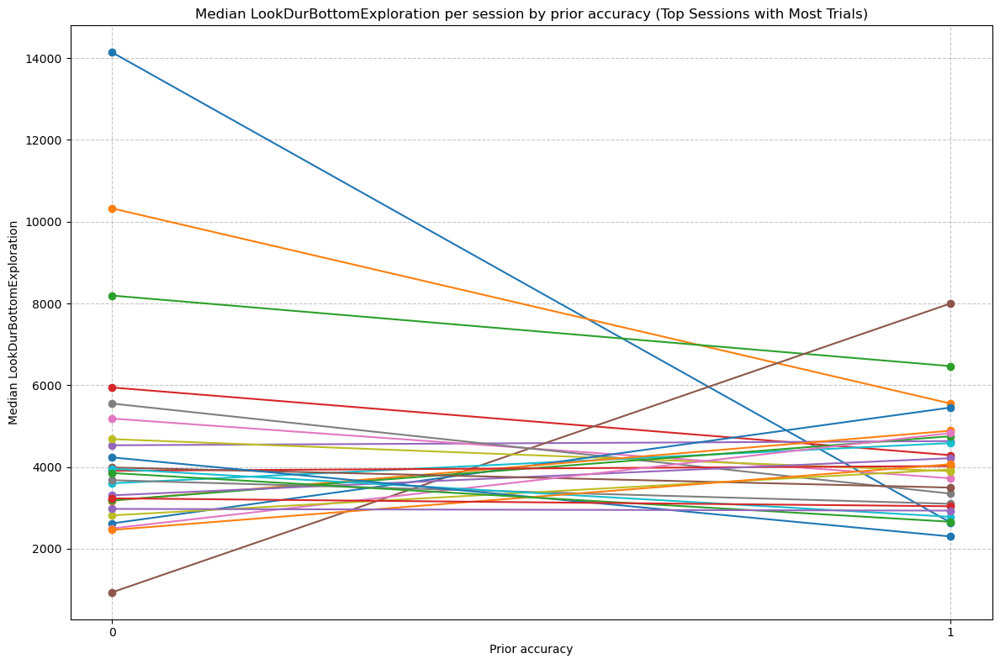

In [6]:
# Median LookDurBottomExploration per session by prior accuracy (top sessions with most trials)

LookDurBottomExploration_per_trial_prior_accuracy = data.groupby(['session', 'trialno', 'prior_accuracy'])['LookDurBottomExploration'].sum().reset_index()
LookDurBottomExploration_per_trial_prior_accuracy.dropna(inplace=True)
median_LookDurBottomExploration_per_session_prior_accuracy = LookDurBottomExploration_per_trial_prior_accuracy.groupby(['session', 'prior_accuracy'])['LookDurBottomExploration'].median().unstack()

plt.figure(figsize=(12, 8))

top_sessions = median_LookDurBottomExploration_per_session_prior_accuracy.sum(axis=1).nlargest(25).index

for session in top_sessions:
    session_data = median_LookDurBottomExploration_per_session_prior_accuracy.loc[session].dropna()
    plt.plot(session_data.index, session_data, marker='o', linestyle='-', label=f'Session {session}')

plt.title('Median LookDurBottomExploration per session by prior accuracy (Top Sessions with Most Trials)')
plt.xlabel('Prior accuracy')
plt.ylabel('Median LookDurBottomExploration')
plt.xticks([0, 1]) 
plt.grid(True, linestyle='--', alpha=0.7)
#plt.legend()
plt.tight_layout()
plt.show()

Shapiro-Wilk test for 0.0: p-value = 1.5827326554427763e-18
Shapiro-Wilk test for 1.0: p-value = 2.89184747363516e-20
Levene's test for homogeneity of variances: p-value = nan
Kruskal-Wallis test:
H-statistic: nan
p-value: nan
Shapiro-Wilk test for 0.0: p-value = 2.872371259955407e-20
Shapiro-Wilk test for 1.0: p-value = 1.6172880517262917e-23
Levene's test for homogeneity of variances: p-value = nan
Kruskal-Wallis test:
H-statistic: nan
p-value: nan
Mean Duration of Exploration by Prior Accuracy:
[5795.10071942 5736.84023669]
SEM Duration of Exploration by Prior Accuracy:
[249.62273285 223.97359198]
Mean Duration of Decision by Prior Accuracy:
[2893.88489209 2629.69230769]
SEM Duration of Decision by Prior Accuracy:
[147.4871561  121.58665322]


C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


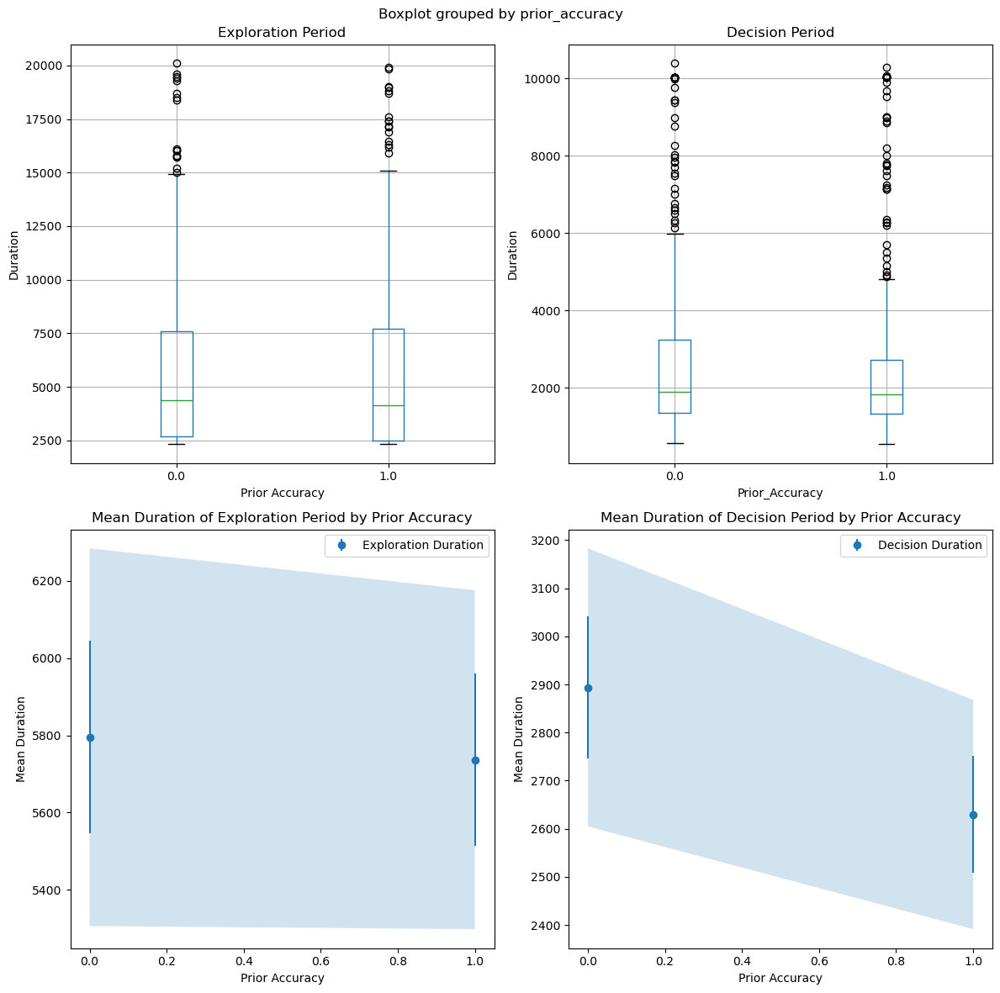

In [7]:
# Duration of both exploration and decision periods by.prior accuracy

DurExploration_by_prior_accuracy = [data[data['prior_accuracy'] == level]['durExplorationPeriod'] for level in data['prior_accuracy'].unique()]
DurExploration_by_prior_accuracy = [group.dropna() for group in DurExploration_by_prior_accuracy]

DurDecision_by_prior_accuracy = [data[data['prior_accuracy'] == level]['durDecisionPeriod'] for level in data['prior_accuracy'].unique()]
DurDecision_by_prior_accuracy = [group.dropna() for group in DurDecision_by_prior_accuracy]

# Shapiro-Wilk test for normality - Exploration
for group_name, group_data in data.groupby('prior_accuracy')['durExplorationPeriod']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")
    
# Levene's test for homogeneity of variances - Exploration
stat, p = levene(*DurExploration_by_prior_accuracy)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test - Exploration
H, p = kruskal(*DurExploration_by_prior_accuracy)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Shapiro-Wilk test for normality - Decision
for group_name, group_data in data.groupby('prior_accuracy')['durDecisionPeriod']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")
    
# Levene's test for homogeneity of variances - Decision
stat, p = levene(*DurDecision_by_prior_accuracy)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test - Decision
H, p = kruskal(*DurDecision_by_prior_accuracy)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of duration of exploration period by prior accuracy
mean_exp_duration_by_prior_accuracy = data.groupby('prior_accuracy')['durExplorationPeriod'].mean().values
sem_exp_duration_by_prior_accuracy = data.groupby('prior_accuracy')['durExplorationPeriod'].sem().values

# Confidence intervals for exploration
exploration_conf_intervals = 1.96 * sem_exp_duration_by_prior_accuracy  

print("Mean Duration of Exploration by Prior Accuracy:")
print(mean_exp_duration_by_prior_accuracy)
print("SEM Duration of Exploration by Prior Accuracy:")
print(sem_exp_duration_by_prior_accuracy)

# Mean and SEM of duration of decision period by prior accuracy
mean_dec_duration_by_prior_accuracy = data.groupby('prior_accuracy')['durDecisionPeriod'].mean().values
sem_dec_duration_by_prior_accuracy = data.groupby('prior_accuracy')['durDecisionPeriod'].sem().values

# Confidence intervals for decision 
decision_conf_intervals = 1.96 * sem_dec_duration_by_prior_accuracy  

print("Mean Duration of Decision by Prior Accuracy:")
print(mean_dec_duration_by_prior_accuracy)
print("SEM Duration of Decision by Prior Accuracy:")
print(sem_dec_duration_by_prior_accuracy)

# Plots
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(12, 12))

# Exploration Period Boxplot
data.boxplot(column='durExplorationPeriod', by='prior_accuracy', ax=axs[0, 0])
axs[0, 0].set_title('Exploration Period')
axs[0, 0].set_xlabel('Prior Accuracy')
axs[0, 0].set_ylabel('Duration')

# Decision Period Boxplot
data.boxplot(column='durDecisionPeriod', by='prior_accuracy', ax=axs[0, 1])
axs[0, 1].set_title('Decision Period')
axs[0, 1].set_xlabel('Prior_Accuracy')
axs[0, 1].set_ylabel('Duration')

# Error bars with confidence intervals
axs[1, 0].errorbar(np.arange(len(mean_exp_duration_by_prior_accuracy)), mean_exp_duration_by_prior_accuracy, yerr=sem_exp_duration_by_prior_accuracy, fmt='o', label='Exploration Duration')
axs[1, 0].fill_between(np.arange(len(mean_exp_duration_by_prior_accuracy)), mean_exp_duration_by_prior_accuracy - exploration_conf_intervals, mean_exp_duration_by_prior_accuracy + exploration_conf_intervals, alpha=0.2)
axs[1, 0].set_xlabel('Prior Accuracy')
axs[1, 0].set_ylabel('Mean Duration')
axs[1, 0].set_title('Mean Duration of Exploration Period by Prior Accuracy')
axs[1, 0].legend()

axs[1, 1].errorbar(np.arange(len(mean_dec_duration_by_prior_accuracy)), mean_dec_duration_by_prior_accuracy, yerr=sem_dec_duration_by_prior_accuracy, fmt='o', label='Decision Duration')
axs[1, 1].fill_between(np.arange(len(mean_dec_duration_by_prior_accuracy)), mean_dec_duration_by_prior_accuracy - decision_conf_intervals, mean_dec_duration_by_prior_accuracy + decision_conf_intervals, alpha=0.2)
axs[1, 1].set_xlabel('Prior Accuracy')
axs[1, 1].set_ylabel('Mean Duration')
axs[1, 1].set_title('Mean Duration of Decision Period by Prior Accuracy')
axs[1, 1].legend()

plt.tight_layout()
plt.show()

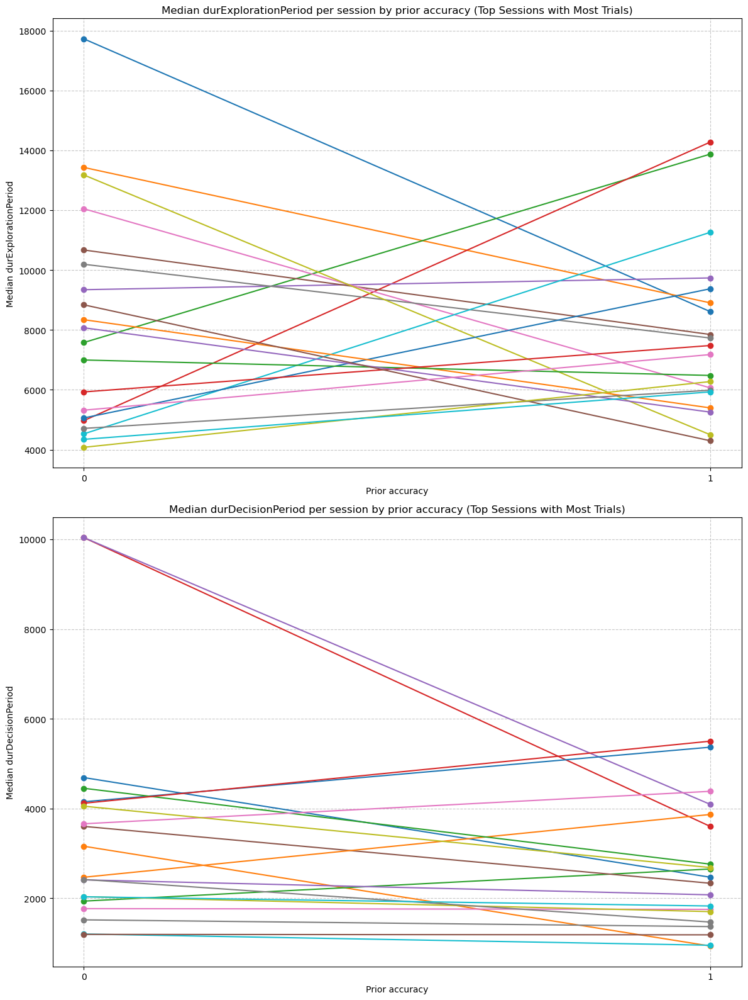

In [8]:
# Median durExplorationPeriod per session by prior accuracy (top sessions with most trials)
durExplorationPeriod_per_trial_prior_accuracy = data.groupby(['session', 'trialno', 'prior_accuracy'])['durExplorationPeriod'].sum().reset_index()
durExplorationPeriod_per_trial_prior_accuracy.dropna(inplace=True)
median_durExplorationPeriod_per_session_prior_accuracy = durExplorationPeriod_per_trial_prior_accuracy.groupby(['session', 'prior_accuracy'])['durExplorationPeriod'].median().unstack()

plt.figure(figsize=(12, 16))

top_sessions = median_durExplorationPeriod_per_session_prior_accuracy.sum(axis=1).nlargest(20).index

plt.subplot(2, 1, 1)
for session in top_sessions:
    session_data = median_durExplorationPeriod_per_session_prior_accuracy.loc[session].dropna()
    plt.plot(session_data.index, session_data, marker='o', linestyle='-', label=f'Session {session}')
plt.title('Median durExplorationPeriod per session by prior accuracy (Top Sessions with Most Trials)')
plt.xlabel('Prior accuracy')
plt.ylabel('Median durExplorationPeriod')
plt.xticks([0, 1]) 
plt.grid(True, linestyle='--', alpha=0.7)
#plt.legend()

# Median durDecisionPeriod per session by prior accuracy (top sessions with most trials)
durDecisionPeriod_per_trial_prior_accuracy = data.groupby(['session', 'trialno', 'prior_accuracy'])['durDecisionPeriod'].sum().reset_index()
durDecisionPeriod_per_trial_prior_accuracy.dropna(inplace=True)
median_durDecisionPeriod_per_session_prior_accuracy = durDecisionPeriod_per_trial_prior_accuracy.groupby(['session', 'prior_accuracy'])['durDecisionPeriod'].median().unstack()

plt.subplot(2, 1, 2)
for session in top_sessions:
    session_data = median_durDecisionPeriod_per_session_prior_accuracy.loc[session].dropna()
    plt.plot(session_data.index, session_data, marker='o', linestyle='-', label=f'Session {session}')
plt.title('Median durDecisionPeriod per session by prior accuracy (Top Sessions with Most Trials)')
plt.xlabel('Prior accuracy')
plt.ylabel('Median durDecisionPeriod')
plt.xticks([0, 1]) 
plt.grid(True, linestyle='--', alpha=0.7)
#plt.legend()

plt.tight_layout()
plt.show()

Shapiro-Wilk test for 0.0: p-value = 5.582130173887753e-14
Shapiro-Wilk test for 1.0: p-value = 4.2724912041369826e-17
Levene's test for homogeneity of variances: p-value = nan
Kruskal-Wallis test:
H-statistic: nan
p-value: nan
Mean Total Trial duration by Prior Accuracy:
prior_accuracy
0.0    8688.985612
1.0    8366.532544
Name: durPeriodTotal, dtype: float64
SEM Total Trial Duration by Prior Accuracy:
prior_accuracy
0.0    300.938127
1.0    273.788321
Name: durPeriodTotal, dtype: float64


C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


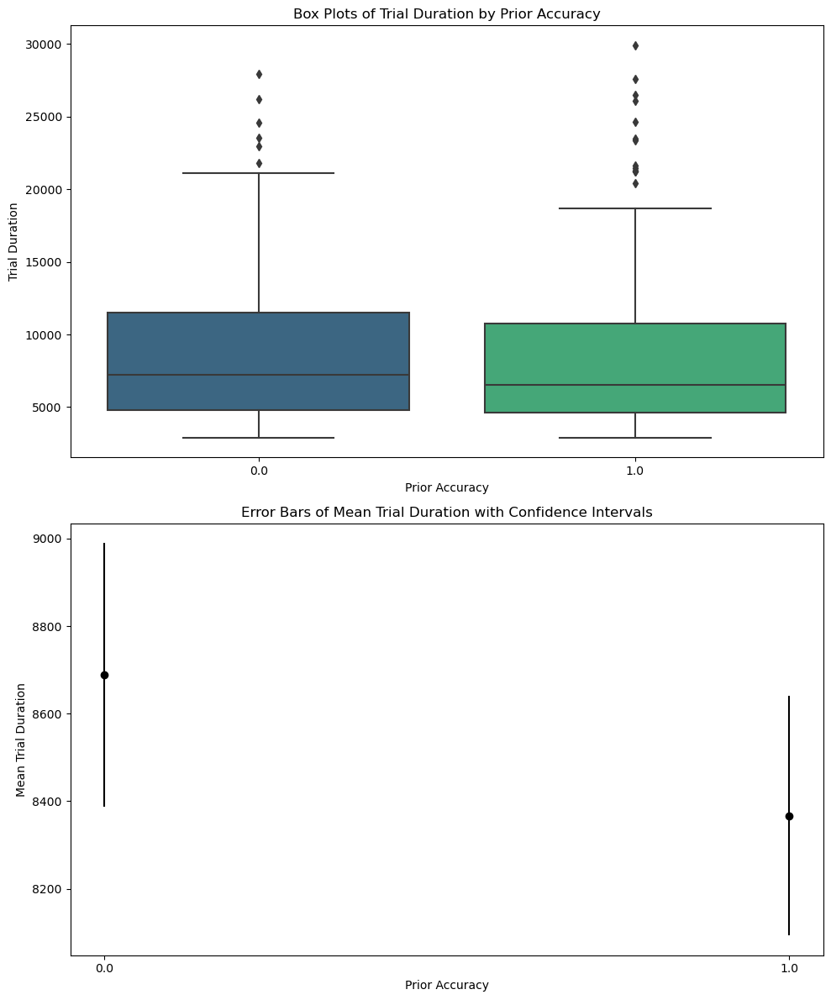

In [9]:
#Total trial duration vs. Prior Accuracy

durPeriodTotal_by_prior_accuracy = [data[data['prior_accuracy'] == level]['durPeriodTotal'] for level in data['prior_accuracy'].unique()]
durPeriodTotaln_by_prior_accuracy = [group.dropna() for group in durPeriodTotal_by_prior_accuracy]

# Shapiro-Wilk test for normality
for group_name, group_data in data.groupby('prior_accuracy')['durPeriodTotal']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")
    
# Levene's test for homogeneity of variances
stat, p = levene(*durPeriodTotal_by_prior_accuracy)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test
H, p = kruskal(*durPeriodTotal_by_prior_accuracy)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of total trial duration by accuracy
mean_trialduration_by_prior_accuracy = data.groupby('prior_accuracy')['durPeriodTotal'].mean()
sem_trialduration_by_prior_accuracy = data.groupby('prior_accuracy')['durPeriodTotal'].sem()
print("Mean Total Trial duration by Prior Accuracy:")
print(mean_trialduration_by_prior_accuracy)
print("SEM Total Trial Duration by Prior Accuracy:")
print(sem_trialduration_by_prior_accuracy)

# Plots
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(10, 12))

sns.boxplot(x='prior_accuracy', y='durPeriodTotal', data=data, palette='viridis', ax=ax1)
ax1.set_xlabel('Prior Accuracy')
ax1.set_ylabel('Trial Duration')
ax1.set_title('Box Plots of Trial Duration by Prior Accuracy')

ax2.errorbar(np.arange(len(mean_trialduration_by_prior_accuracy)), mean_trialduration_by_prior_accuracy, yerr=sem_trialduration_by_prior_accuracy, fmt='o', color='black')
ax2.set_xlabel('Prior Accuracy')
ax2.set_ylabel('Mean Trial Duration')
ax2.set_title('Error Bars of Mean Trial Duration with Confidence Intervals')
ax2.set_xticks(np.arange(len(mean_trialduration_by_prior_accuracy)))
ax2.set_xticklabels(mean_trialduration_by_prior_accuracy.index)

plt.tight_layout()
plt.show()

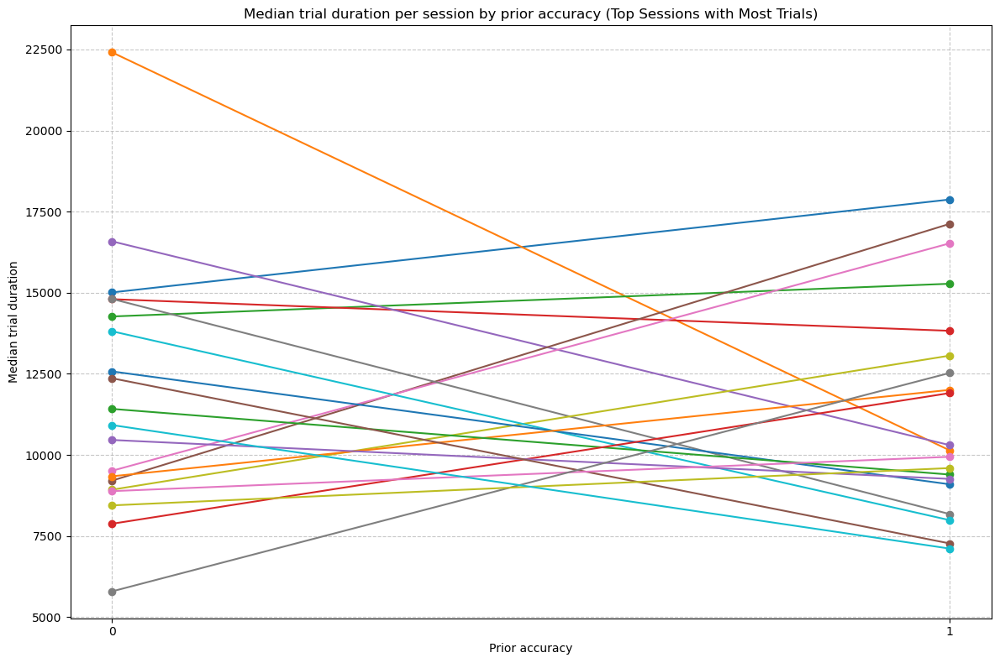

In [10]:
# Median trial duration per session by prior accuracy (top sessions with most trials)

duration_per_trial_prior_accuracy = data.groupby(['session', 'trialno', 'prior_accuracy'])['durPeriodTotal'].sum().reset_index()
duration_per_trial_prior_accuracy.dropna(inplace=True)
median_durPeriodTotal_per_session_prior_accuracy = duration_per_trial_prior_accuracy.groupby(['session', 'prior_accuracy'])['durPeriodTotal'].median().unstack()

plt.figure(figsize=(12, 8))

top_sessions = median_durPeriodTotal_per_session_prior_accuracy.sum(axis=1).nlargest(20).index

for session in top_sessions:
    session_data = median_durPeriodTotal_per_session_prior_accuracy.loc[session].dropna()
    plt.plot(session_data.index, session_data, marker='o', linestyle='-', label=f'Session {session}')

plt.title('Median trial duration per session by prior accuracy (Top Sessions with Most Trials)')
plt.xlabel('Prior accuracy')
plt.ylabel('Median trial duration')
plt.xticks([0, 1]) 
plt.grid(True, linestyle='--', alpha=0.7)
#plt.legend()
plt.tight_layout()
plt.show()

Shapiro-Wilk test for 0.0: p-value = 1.5954546425715716e-15
Shapiro-Wilk test for 1.0: p-value = 2.5596825972092232e-17
Levene's test for homogeneity of variances: p-value = nan
Kruskal-Wallis test:
H-statistic: nan
p-value: nan
Mean LookDurInTDecision by Prior Accuracy:
prior_accuracy
0.0    2073.266187
1.0    2060.201183
Name: LookDurInTDecision, dtype: float64
SEM LookDurInTDecision by Prior Accuracy:
prior_accuracy
0.0    83.145273
1.0    74.747697
Name: LookDurInTDecision, dtype: float64


C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


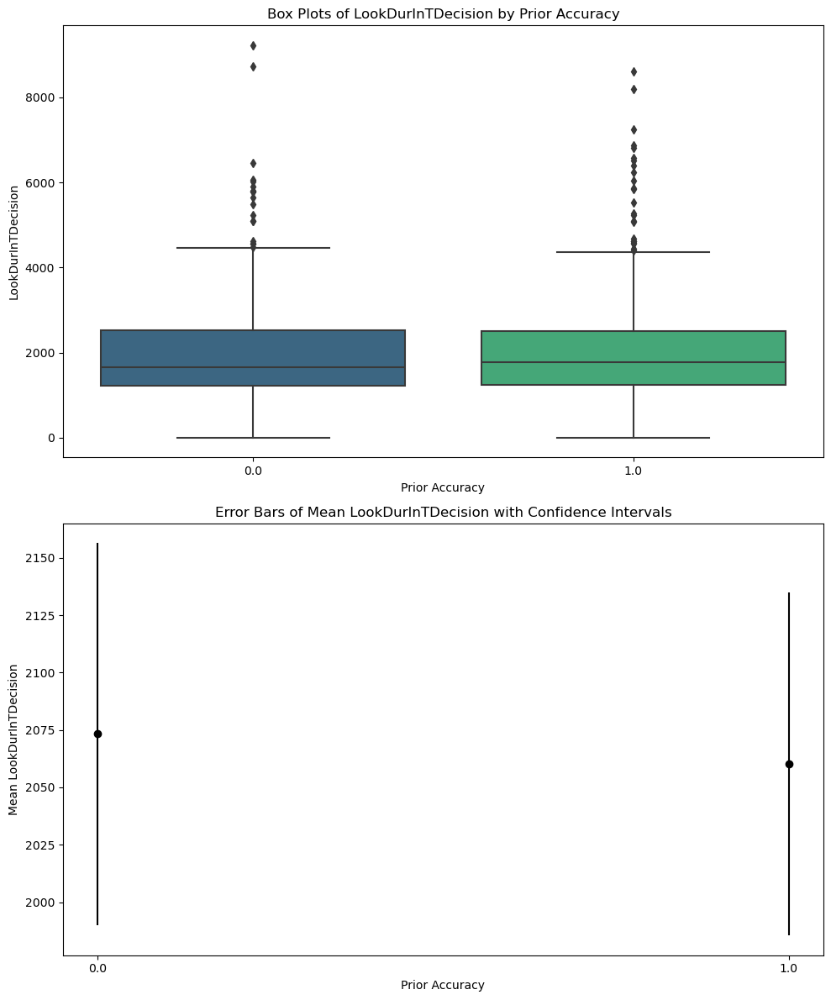

In [11]:
#Look Top Card (decision period) by Prior Accuracy

LookDurInTDecision_by_prior_accuracy = [data[data['prior_accuracy'] == level]['LookDurInTDecision'] for level in data['prior_accuracy'].unique()]
LookDurInTDecision_by_prior_accuracy = [group.dropna() for group in LookDurInTDecision_by_prior_accuracy]

# Shapiro-Wilk test for normality
for group_name, group_data in data.groupby('prior_accuracy')['LookDurInTDecision']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")
    
# Levene's test for homogeneity of variances
stat, p = levene(*LookDurInTDecision_by_prior_accuracy)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test
H, p = kruskal(*LookDurInTDecision_by_prior_accuracy)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of total trial duration by accuracy
mean_LookDurInTDecision_by_prior_accuracy = data.groupby('prior_accuracy')['LookDurInTDecision'].mean()
sem_LookDurInTDecision_by_prior_accuracy = data.groupby('prior_accuracy')['LookDurInTDecision'].sem()
print("Mean LookDurInTDecision by Prior Accuracy:")
print(mean_LookDurInTDecision_by_prior_accuracy)
print("SEM LookDurInTDecision by Prior Accuracy:")
print(sem_LookDurInTDecision_by_prior_accuracy)

# Plots
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(10, 12))

sns.boxplot(x='prior_accuracy', y='LookDurInTDecision', data=data, palette='viridis', ax=ax1)
ax1.set_xlabel('Prior Accuracy')
ax1.set_ylabel('LookDurInTDecision')
ax1.set_title('Box Plots of LookDurInTDecision by Prior Accuracy')

ax2.errorbar(np.arange(len(mean_LookDurInTDecision_by_prior_accuracy)), mean_LookDurInTDecision_by_prior_accuracy, yerr=sem_LookDurInTDecision_by_prior_accuracy, fmt='o', color='black')
ax2.set_xlabel('Prior Accuracy')
ax2.set_ylabel('Mean LookDurInTDecision')
ax2.set_title('Error Bars of Mean LookDurInTDecision with Confidence Intervals')
ax2.set_xticks(np.arange(len(mean_LookDurInTDecision_by_prior_accuracy)))
ax2.set_xticklabels(mean_LookDurInTDecision_by_prior_accuracy.index)

plt.tight_layout()
plt.show()

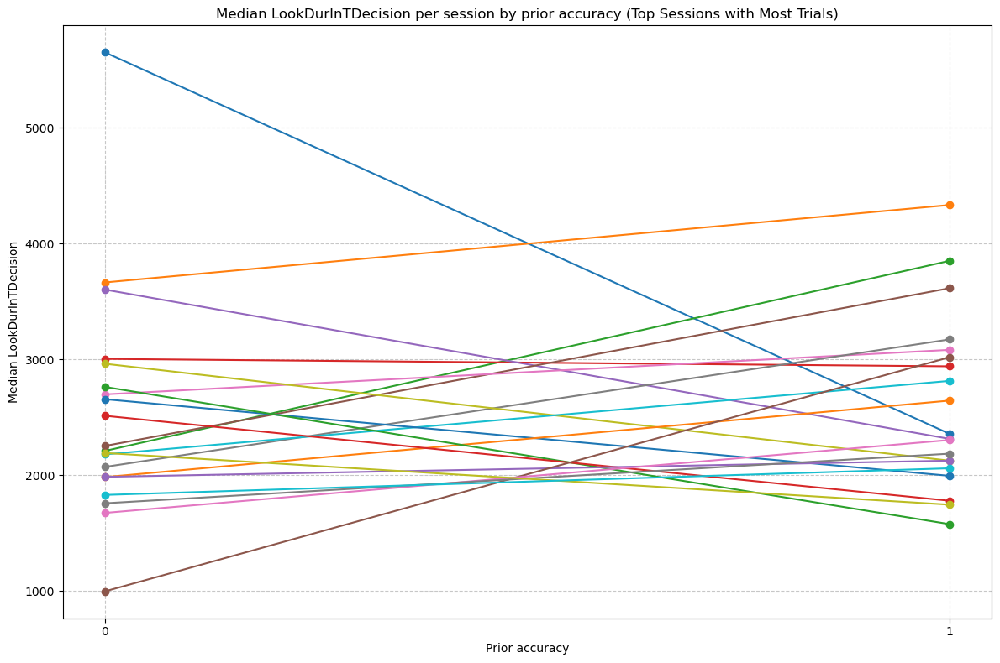

In [12]:
# Median Look Top Card (decision period) by prior accuracy (top sessions with most trials)

LookDurInTDecision_per_trial_prior_accuracy = data.groupby(['session', 'trialno', 'prior_accuracy'])['LookDurInTDecision'].sum().reset_index()
LookDurInTDecision_per_trial_prior_accuracy.dropna(inplace=True)
median_LookDurInTDecision_per_session_prior_accuracy = LookDurInTDecision_per_trial_prior_accuracy.groupby(['session', 'prior_accuracy'])['LookDurInTDecision'].median().unstack()

plt.figure(figsize=(12, 8))

top_sessions = median_LookDurInTDecision_per_session_prior_accuracy.sum(axis=1).nlargest(20).index

for session in top_sessions:
    session_data = median_LookDurInTDecision_per_session_prior_accuracy.loc[session].dropna()
    plt.plot(session_data.index, session_data, marker='o', linestyle='-', label=f'Session {session}')

plt.title('Median LookDurInTDecision per session by prior accuracy (Top Sessions with Most Trials)')
plt.xlabel('Prior accuracy')
plt.ylabel('Median LookDurInTDecision')
plt.xticks([0, 1]) 
plt.grid(True, linestyle='--', alpha=0.7)
#plt.legend()
plt.tight_layout()
plt.show()

Shapiro-Wilk test for 0.0: p-value = 1.943166035474458e-14
Shapiro-Wilk test for 1.0: p-value = 2.0686211406011524e-11
Levene's test for homogeneity of variances: p-value = nan
Kruskal-Wallis test:
H-statistic: nan
p-value: nan
Mean FixNb by Prior Accuracy:
prior_accuracy
0.0    15.55036
1.0    15.43787
Name: FixNb, dtype: float64
SEM FixNb by Prior Accuracy:
prior_accuracy
0.0    0.489439
1.0    0.439031
Name: FixNb, dtype: float64


C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


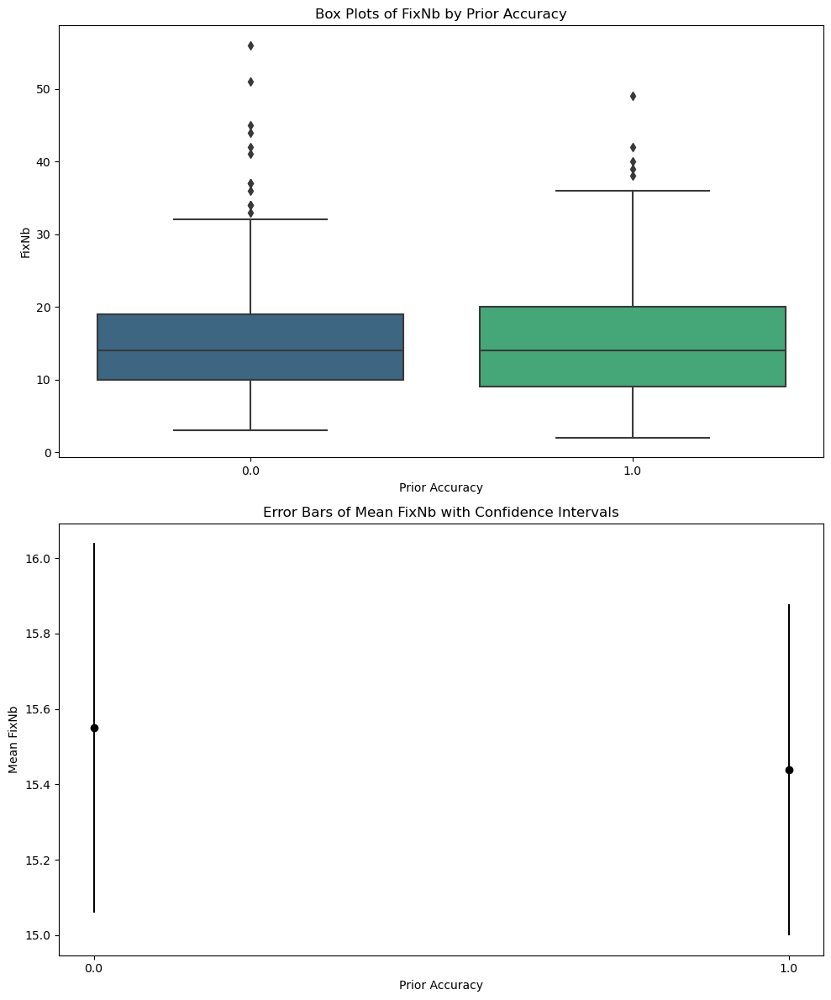

In [13]:
#Fixations by Prior Accuracy

FixNb_by_prior_accuracy = [data[data['prior_accuracy'] == level]['FixNb'] for level in data['prior_accuracy'].unique()]
FixNb_by_prior_accuracy = [group.dropna() for group in FixNb_by_prior_accuracy]

# Shapiro-Wilk test for normality
for group_name, group_data in data.groupby('prior_accuracy')['FixNb']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")
    
# Levene's test for homogeneity of variances
stat, p = levene(*FixNb_by_prior_accuracy)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test
H, p = kruskal(*FixNb_by_prior_accuracy)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of FixNb by accuracy
mean_FixNb_by_prior_accuracy = data.groupby('prior_accuracy')['FixNb'].mean()
sem_FixNb_by_prior_accuracy = data.groupby('prior_accuracy')['FixNb'].sem()
print("Mean FixNb by Prior Accuracy:")
print(mean_FixNb_by_prior_accuracy)
print("SEM FixNb by Prior Accuracy:")
print(sem_FixNb_by_prior_accuracy)

# Plots
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(10, 12))

sns.boxplot(x='prior_accuracy', y='FixNb', data=data, palette='viridis', ax=ax1)
ax1.set_xlabel('Prior Accuracy')
ax1.set_ylabel('FixNb')
ax1.set_title('Box Plots of FixNb by Prior Accuracy')

ax2.errorbar(np.arange(len(mean_FixNb_by_prior_accuracy)), mean_FixNb_by_prior_accuracy, yerr=sem_FixNb_by_prior_accuracy, fmt='o', color='black')
ax2.set_xlabel('Prior Accuracy')
ax2.set_ylabel('Mean FixNb')
ax2.set_title('Error Bars of Mean FixNb with Confidence Intervals')
ax2.set_xticks(np.arange(len(mean_FixNb_by_prior_accuracy)))
ax2.set_xticklabels(mean_FixNb_by_prior_accuracy.index)

plt.tight_layout()
plt.show()

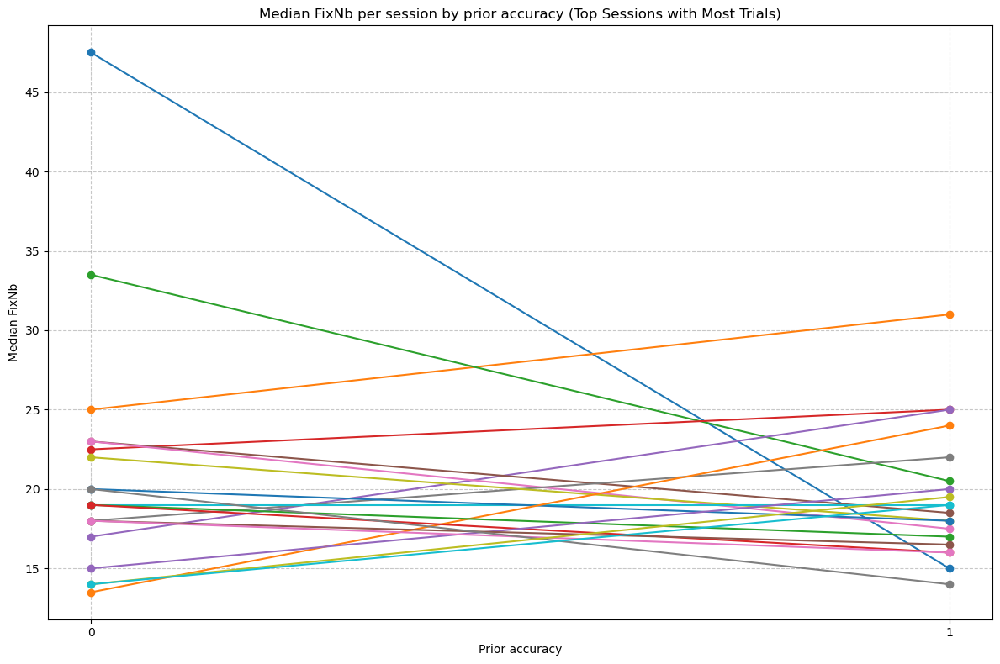

In [14]:
# Median fixations by prior accuracy (top sessions with most trials)

FixNb_per_trial_prior_accuracy = data.groupby(['session', 'trialno', 'prior_accuracy'])['FixNb'].sum().reset_index()
FixNb_per_trial_prior_accuracy.dropna(inplace=True)
median_FixNb_per_session_prior_accuracy = FixNb_per_trial_prior_accuracy.groupby(['session', 'prior_accuracy'])['FixNb'].median().unstack()

plt.figure(figsize=(12, 8))

top_sessions = median_FixNb_per_session_prior_accuracy.sum(axis=1).nlargest(20).index

for session in top_sessions:
    session_data = median_FixNb_per_session_prior_accuracy.loc[session].dropna()
    plt.plot(session_data.index, session_data, marker='o', linestyle='-', label=f'Session {session}')

plt.title('Median FixNb per session by prior accuracy (Top Sessions with Most Trials)')
plt.xlabel('Prior accuracy')
plt.ylabel('Median FixNb')
plt.xticks([0, 1]) 
plt.grid(True, linestyle='--', alpha=0.7)
#plt.legend()
plt.tight_layout()
plt.show()

Shapiro-Wilk test for 0.0: p-value = 1.4383300242092882e-17
Shapiro-Wilk test for 1.0: p-value = 2.343512937199919e-13
Levene's test for homogeneity of variances: p-value = nan
Kruskal-Wallis test:
H-statistic: nan
p-value: nan
Shapiro-Wilk test for 0.0: p-value = 1.4202900803167588e-17
Shapiro-Wilk test for 1.0: p-value = 3.540584182614658e-21
Levene's test for homogeneity of variances: p-value = nan
Kruskal-Wallis test:
H-statistic: nan
p-value: nan
Mean FixNb during Exploration by Prior Accuracy:
[10.47841727 10.4260355 ]
SEM FixNb during Exploration by Prior Accuracy:
[0.43776618 0.36626686]
Mean FixNb during Decision by Prior Accuracy:
[5.07194245 5.01183432]
SEM FixNb during Decision by Prior Accuracy:
[0.20539187 0.18617127]


C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


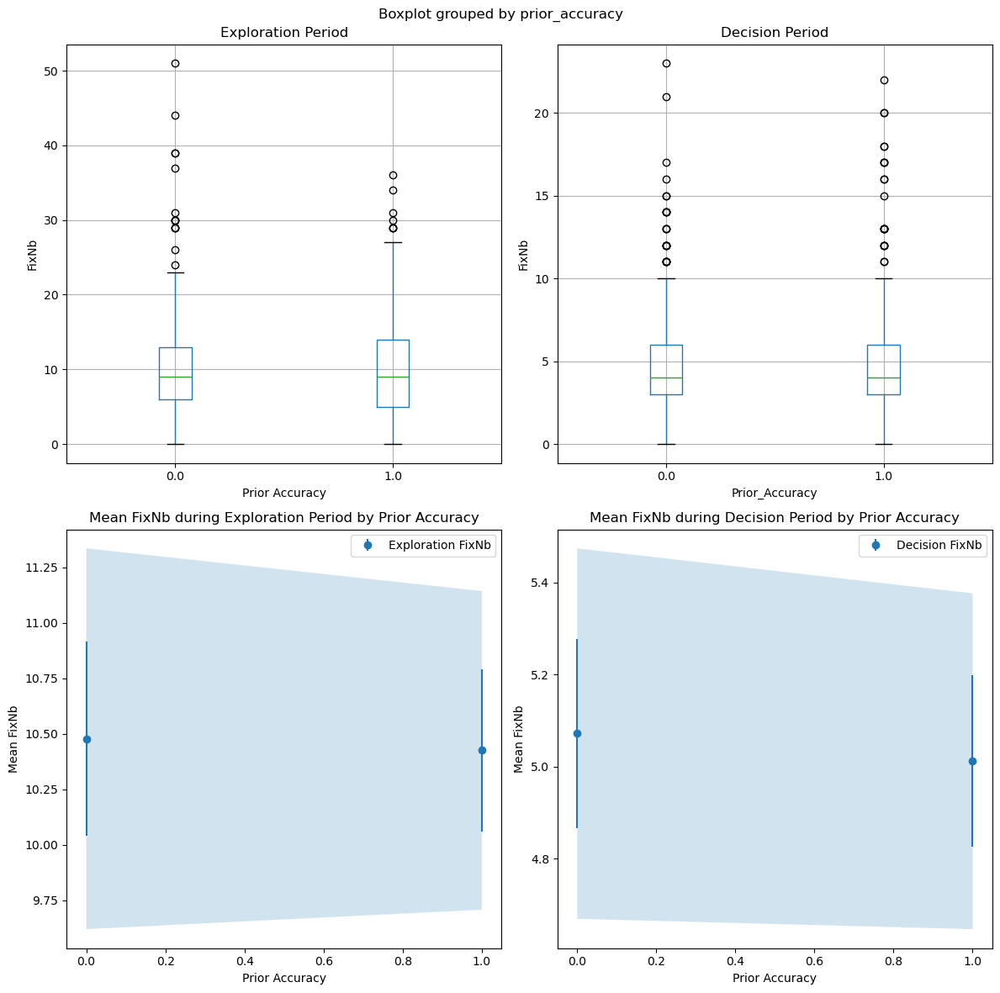

In [15]:
#Fixations exploration vs. decision periods by prior accuracy


FixNbExploration_by_prior_accuracy = [data[data['prior_accuracy'] == level]['FixNbExplorationPeriod'] for level in data['prior_accuracy'].unique()]
FixNbExploration_by_prior_accuracy = [group.dropna() for group in FixNbExploration_by_prior_accuracy]

FixNbDecision_by_prior_accuracy = [data[data['prior_accuracy'] == level]['FixNbDecisionPeriod'] for level in data['prior_accuracy'].unique()]
FixNbDecision_by_prior_accuracy = [group.dropna() for group in FixNbDecision_by_prior_accuracy]

# Shapiro-Wilk test for normality - Exploration
for group_name, group_data in data.groupby('prior_accuracy')['FixNbExplorationPeriod']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")
    
# Levene's test for homogeneity of variances - Exploration
stat, p = levene(*FixNbExploration_by_prior_accuracy)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test - Exploration
H, p = kruskal(*FixNbExploration_by_prior_accuracy)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Shapiro-Wilk test for normality - Decision
for group_name, group_data in data.groupby('prior_accuracy')['FixNbDecisionPeriod']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")
    
# Levene's test for homogeneity of variances - Decision
stat, p = levene(*FixNbDecision_by_prior_accuracy)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test - Decision
H, p = kruskal(*FixNbDecision_by_prior_accuracy)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of duration of exploration period by prior accuracy
mean_exp_FixNb_by_prior_accuracy = data.groupby('prior_accuracy')['FixNbExplorationPeriod'].mean().values
sem_exp_FixNb_by_prior_accuracy = data.groupby('prior_accuracy')['FixNbExplorationPeriod'].sem().values

# Confidence intervals for exploration
FixNbexploration_conf_intervals = 1.96 * sem_exp_FixNb_by_prior_accuracy  

print("Mean FixNb during Exploration by Prior Accuracy:")
print(mean_exp_FixNb_by_prior_accuracy)
print("SEM FixNb during Exploration by Prior Accuracy:")
print(sem_exp_FixNb_by_prior_accuracy)

# Mean and SEM of duration of decision period by prior accuracy
mean_dec_FixNb_by_prior_accuracy = data.groupby('prior_accuracy')['FixNbDecisionPeriod'].mean().values
sem_dec_FixNb_by_prior_accuracy = data.groupby('prior_accuracy')['FixNbDecisionPeriod'].sem().values

# Confidence intervals for decision 
FixNbdecision_conf_intervals = 1.96 * sem_dec_FixNb_by_prior_accuracy  

print("Mean FixNb during Decision by Prior Accuracy:")
print(mean_dec_FixNb_by_prior_accuracy)
print("SEM FixNb during Decision by Prior Accuracy:")
print(sem_dec_FixNb_by_prior_accuracy)

# Plots
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(12, 12))

# Exploration Period Boxplot
data.boxplot(column='FixNbExplorationPeriod', by='prior_accuracy', ax=axs[0, 0])
axs[0, 0].set_title('Exploration Period')
axs[0, 0].set_xlabel('Prior Accuracy')
axs[0, 0].set_ylabel('FixNb')

# Decision Period Boxplot
data.boxplot(column='FixNbDecisionPeriod', by='prior_accuracy', ax=axs[0, 1])
axs[0, 1].set_title('Decision Period')
axs[0, 1].set_xlabel('Prior_Accuracy')
axs[0, 1].set_ylabel('FixNb')

# Error bars with confidence intervals
axs[1, 0].errorbar(np.arange(len(mean_exp_FixNb_by_prior_accuracy)), mean_exp_FixNb_by_prior_accuracy, yerr=sem_exp_FixNb_by_prior_accuracy, fmt='o', label='Exploration FixNb')
axs[1, 0].fill_between(np.arange(len(mean_exp_FixNb_by_prior_accuracy)), mean_exp_FixNb_by_prior_accuracy - FixNbexploration_conf_intervals, mean_exp_FixNb_by_prior_accuracy + FixNbexploration_conf_intervals, alpha=0.2)
axs[1, 0].set_xlabel('Prior Accuracy')
axs[1, 0].set_ylabel('Mean FixNb')
axs[1, 0].set_title('Mean FixNb during Exploration Period by Prior Accuracy')
axs[1, 0].legend()

axs[1, 1].errorbar(np.arange(len(mean_dec_FixNb_by_prior_accuracy)), mean_dec_FixNb_by_prior_accuracy, yerr=sem_dec_FixNb_by_prior_accuracy, fmt='o', label='Decision FixNb')
axs[1, 1].fill_between(np.arange(len(mean_dec_FixNb_by_prior_accuracy)), mean_dec_FixNb_by_prior_accuracy - FixNbdecision_conf_intervals, mean_dec_FixNb_by_prior_accuracy + FixNbdecision_conf_intervals, alpha=0.2)
axs[1, 1].set_xlabel('Prior Accuracy')
axs[1, 1].set_ylabel('Mean FixNb')
axs[1, 1].set_title('Mean FixNb during Decision Period by Prior Accuracy')
axs[1, 1].legend()

plt.tight_layout()
plt.show()


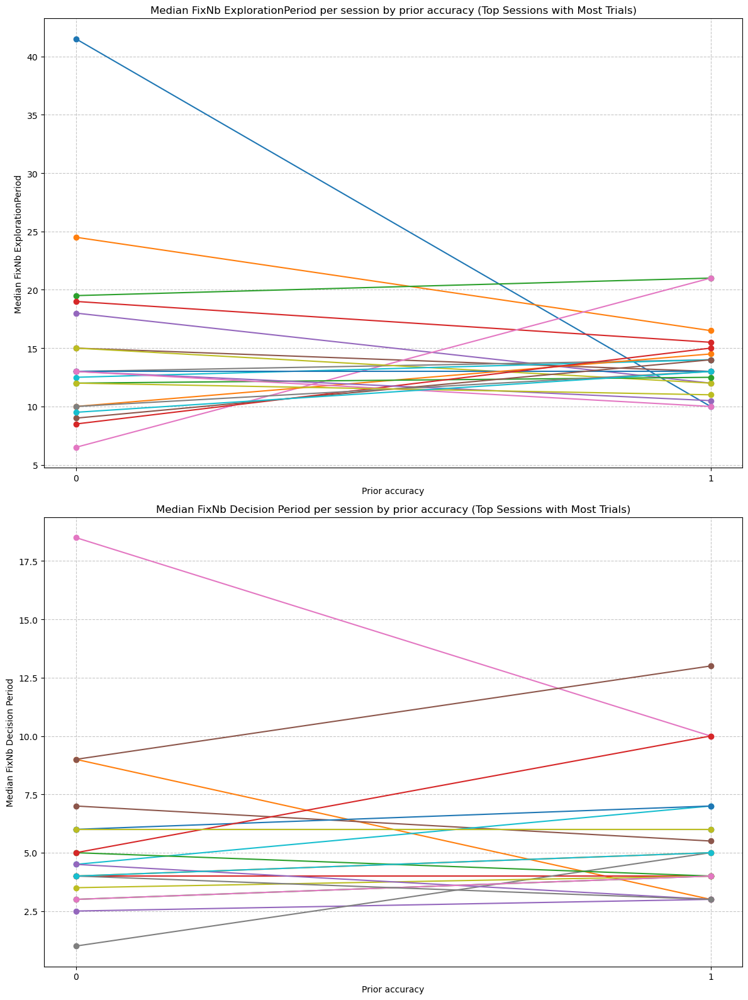

In [16]:
# Median Fixations exploration vs. decision periods by prior accuracy (top sessions with most trials)

FixNbExplorationPeriod_per_trial_prior_accuracy = data.groupby(['session', 'trialno', 'prior_accuracy'])['FixNbExplorationPeriod'].sum().reset_index()
FixNbExplorationPeriod_per_trial_prior_accuracy.dropna(inplace=True)
median_FixNbExplorationPeriod_per_session_prior_accuracy = FixNbExplorationPeriod_per_trial_prior_accuracy.groupby(['session', 'prior_accuracy'])['FixNbExplorationPeriod'].median().unstack()

plt.figure(figsize=(12, 16))

top_sessions = median_FixNbExplorationPeriod_per_session_prior_accuracy.sum(axis=1).nlargest(20).index

plt.subplot(2, 1, 1)
for session in top_sessions:
    session_data = median_FixNbExplorationPeriod_per_session_prior_accuracy.loc[session].dropna()
    plt.plot(session_data.index, session_data, marker='o', linestyle='-', label=f'Session {session}')
plt.title('Median FixNb ExplorationPeriod per session by prior accuracy (Top Sessions with Most Trials)')
plt.xlabel('Prior accuracy')
plt.ylabel('Median FixNb ExplorationPeriod')
plt.xticks([0, 1]) 
plt.grid(True, linestyle='--', alpha=0.7)
#plt.legend()

FixNbDecisionPeriod_per_trial_prior_accuracy = data.groupby(['session', 'trialno', 'prior_accuracy'])['FixNbDecisionPeriod'].sum().reset_index()
FixNbDecisionPeriod_per_trial_prior_accuracy.dropna(inplace=True)
median_FixNbDecisionPeriod_per_session_prior_accuracy = FixNbDecisionPeriod_per_trial_prior_accuracy.groupby(['session', 'prior_accuracy'])['FixNbDecisionPeriod'].median().unstack()

plt.subplot(2, 1, 2)
for session in top_sessions:
    session_data = median_FixNbDecisionPeriod_per_session_prior_accuracy.loc[session].dropna()
    plt.plot(session_data.index, session_data, marker='o', linestyle='-', label=f'Session {session}')
plt.title('Median FixNb Decision Period per session by prior accuracy (Top Sessions with Most Trials)')
plt.xlabel('Prior accuracy')
plt.ylabel('Median FixNb Decision Period')
plt.xticks([0, 1]) 
plt.grid(True, linestyle='--', alpha=0.7)
#plt.legend()

plt.tight_layout()
plt.show()

Shapiro-Wilk test for 0.0: p-value = 5.302232286003772e-15
Shapiro-Wilk test for 1.0: p-value = 1.9798151128915014e-15
Levene's test for homogeneity of variances: p-value = nan
Kruskal-Wallis test:
H-statistic: nan
p-value: nan
Mean Switches Exploration Period by Prior Accuracy:
prior_accuracy
0.0    2.172662
1.0    2.248521
Name: SwitchesExplorationPeriod, dtype: float64
SEM Switches Exploration Period by Prior Accuracy:
prior_accuracy
0.0    0.075221
1.0    0.075954
Name: SwitchesExplorationPeriod, dtype: float64


C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


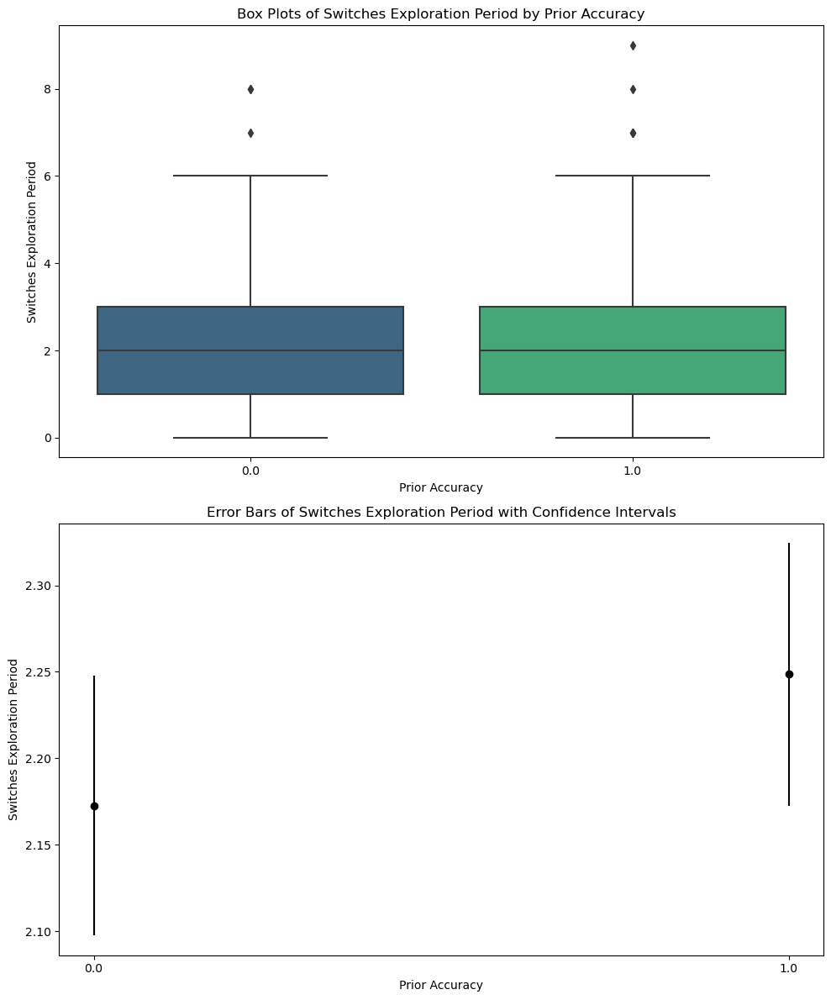

In [17]:
#Switches by prior accuracy (exploration period)

Switches_Exploration_by_prior_accuracy = [data[data['prior_accuracy'] == level]['FixNb'] for level in data['SwitchesExplorationPeriod'].unique()]
Switches_Exploration_by_prior_accuracy = [group.dropna() for group in Switches_Exploration_by_prior_accuracy]

# Shapiro-Wilk test for normality
for group_name, group_data in data.groupby('prior_accuracy')['SwitchesExplorationPeriod']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")
    
# Levene's test for homogeneity of variances
stat, p = levene(*Switches_Exploration_by_prior_accuracy)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test
H, p = kruskal(*Switches_Exploration_by_prior_accuracy)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of FixNb by accuracy
mean_Switches_Exploration_by_prior_accuracy = data.groupby('prior_accuracy')['SwitchesExplorationPeriod'].mean()
sem_Switches_Exploration_by_prior_accuracy = data.groupby('prior_accuracy')['SwitchesExplorationPeriod'].sem()
print("Mean Switches Exploration Period by Prior Accuracy:")
print(mean_Switches_Exploration_by_prior_accuracy)
print("SEM Switches Exploration Period by Prior Accuracy:")
print(sem_Switches_Exploration_by_prior_accuracy)

# Plots
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(10, 12))

sns.boxplot(x='prior_accuracy', y='SwitchesExplorationPeriod', data=data, palette='viridis', ax=ax1)
ax1.set_xlabel('Prior Accuracy')
ax1.set_ylabel('Switches Exploration Period')
ax1.set_title('Box Plots of Switches Exploration Period by Prior Accuracy')

ax2.errorbar(np.arange(len(mean_Switches_Exploration_by_prior_accuracy)), mean_Switches_Exploration_by_prior_accuracy, yerr=sem_Switches_Exploration_by_prior_accuracy, fmt='o', color='black')
ax2.set_xlabel('Prior Accuracy')
ax2.set_ylabel('Switches Exploration Period')
ax2.set_title('Error Bars of Switches Exploration Period with Confidence Intervals')
ax2.set_xticks(np.arange(len(mean_Switches_Exploration_by_prior_accuracy)))
ax2.set_xticklabels(mean_Switches_Exploration_by_prior_accuracy.index)

plt.tight_layout()
plt.show()

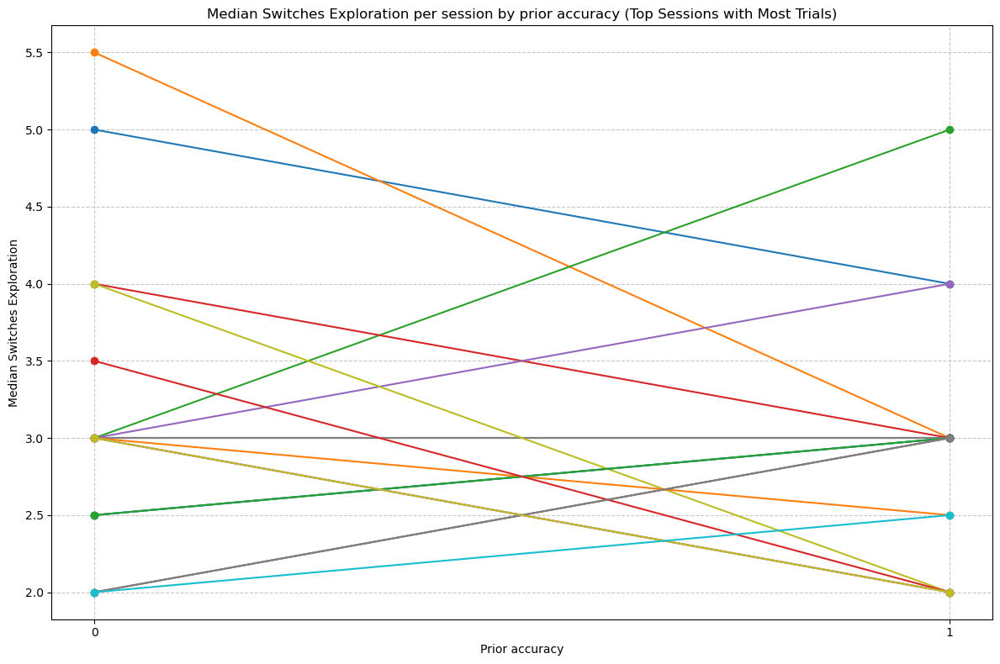

In [18]:
# Median switches by prior accuracy (exploration period) (top sessions with most trials)

Switches_Exploration_per_trial_prior_accuracy = data.groupby(['session', 'trialno', 'prior_accuracy'])['SwitchesExplorationPeriod'].sum().reset_index()
Switches_Exploration_per_trial_prior_accuracy.dropna(inplace=True)
median_Switches_Exploration_per_session_prior_accuracy = Switches_Exploration_per_trial_prior_accuracy.groupby(['session', 'prior_accuracy'])['SwitchesExplorationPeriod'].median().unstack()

plt.figure(figsize=(12, 8))

top_sessions = median_Switches_Exploration_per_session_prior_accuracy.sum(axis=1).nlargest(20).index

for session in top_sessions:
    session_data = median_Switches_Exploration_per_session_prior_accuracy.loc[session].dropna()
    plt.plot(session_data.index, session_data, marker='o', linestyle='-', label=f'Session {session}')

plt.title('Median Switches Exploration per session by prior accuracy (Top Sessions with Most Trials)')
plt.xlabel('Prior accuracy')
plt.ylabel('Median Switches Exploration')
plt.xticks([0, 1]) 
plt.grid(True, linestyle='--', alpha=0.7)
#plt.legend()
plt.tight_layout()
plt.show()

In [4]:
#Correlation between prior accuracy and some of the variables

grouped = data.groupby('prior_accuracy')

continuous_variables = ['durExplorationPeriod', 'durDecisionPeriod', 'durPeriodTotal', 'SwitchesExplorationPeriod', 
                        'FixNb', 'FixNbInTDecision', 'FixNbBottomExploration', 'LookDurInTDecision', 'LookDurBottomExploration']

# Kruskal-Wallis test 
kruskal_results = {}
spearman_results = {}
for variable in continuous_variables:
    groups_data = [group[variable].dropna() for _, group in grouped]
    kruskal_stat, kruskal_pvalue = kruskal(*groups_data)
    kruskal_results[variable] = (kruskal_stat, kruskal_pvalue)

for variable in continuous_variables:
    print(f"Variable: {variable}")
    print(f"Kruskal-Wallis test: test statistic = {kruskal_results[variable][0]:.4f}, p-value = {kruskal_results[variable][1]:.4f}")

Variable: durExplorationPeriod
Kruskal-Wallis test: test statistic = 0.2678, p-value = 0.6048
Variable: durDecisionPeriod
Kruskal-Wallis test: test statistic = 1.1538, p-value = 0.2827
Variable: durPeriodTotal
Kruskal-Wallis test: test statistic = 1.1174, p-value = 0.2905
Variable: SwitchesExplorationPeriod
Kruskal-Wallis test: test statistic = 0.1934, p-value = 0.6601
Variable: FixNb
Kruskal-Wallis test: test statistic = 0.0566, p-value = 0.8119
Variable: FixNbInTDecision
Kruskal-Wallis test: test statistic = 0.1787, p-value = 0.6725
Variable: FixNbBottomExploration
Kruskal-Wallis test: test statistic = 0.0103, p-value = 0.9192
Variable: LookDurInTDecision
Kruskal-Wallis test: test statistic = 0.0235, p-value = 0.8781
Variable: LookDurBottomExploration
Kruskal-Wallis test: test statistic = 0.0253, p-value = 0.8737


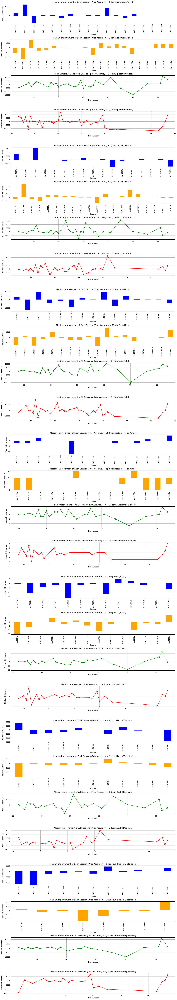

In [7]:
# Calculating Improvement session by session, trial by trial according to prior accuracy

variables = [
    'durExplorationPeriod',
    'durDecisionPeriod',
    'durPeriodTotal',
    'SwitchesExplorationPeriod',
    'FixNb',
    'LookDurInTDecision',
    'LookDurBottomExploration'
]

fig, axes = plt.subplots(nrows=len(variables)*4, ncols=1, figsize=(15,12 * len(variables)))

for i, variable in enumerate(variables):
    data[f'{variable}_diff'] = data.groupby('session')[variable].diff()
    data.dropna(subset=[f'{variable}_diff'], inplace=True)
    
    prior_accuracy_0_improvement = data[data['prior_accuracy'] == 0].groupby('session')[f'{variable}_diff'].median()
    prior_accuracy_0_improvement.plot(kind='bar', ax=axes[i*4], color='blue')
    axes[i*4].set_title(f'Median Improvement of Each Session (Prior Accuracy = 0) ({variable})')
    axes[i*4].set_xlabel('Session')
    axes[i*4].set_ylabel('Median Difference')

    prior_accuracy_1_improvement = data[data['prior_accuracy'] == 1].groupby('session')[f'{variable}_diff'].median()
    prior_accuracy_1_improvement.plot(kind='bar', ax=axes[i*4+1], color='orange')
    axes[i*4+1].set_title(f'Median Improvement of Each Session (Prior Accuracy = 1) ({variable})')
    axes[i*4+1].set_xlabel('Session')
    axes[i*4+1].set_ylabel('Median Difference')

    median_prior_accuracy_0 = data[data['prior_accuracy'] == 0].groupby('trialno')[f'{variable}_diff'].median()

    axes[i*4+2].plot(median_prior_accuracy_0.index, median_prior_accuracy_0.values, marker='o', linestyle='-', color='green')
    axes[i*4+2].set_title(f'Median Improvement of All Sessions (Prior Accuracy = 0) ({variable})')
    axes[i*4+2].set_xlabel('Trial Number')
    axes[i*4+2].set_ylabel('Median Difference')
    axes[i*4+2].grid(True)

    median_prior_accuracy_1 = data[data['prior_accuracy'] == 1].groupby('trialno')[f'{variable}_diff'].median()

    axes[i*4+3].plot(median_prior_accuracy_1.index, median_prior_accuracy_1.values, marker='o', linestyle='-', color='red')
    axes[i*4+3].set_title(f'Median Improvement of All Sessions (Prior Accuracy = 1) ({variable})')
    axes[i*4+3].set_xlabel('Trial Number')
    axes[i*4+3].set_ylabel('Median Difference')
    axes[i*4+3].grid(True)

plt.tight_layout()
plt.show()

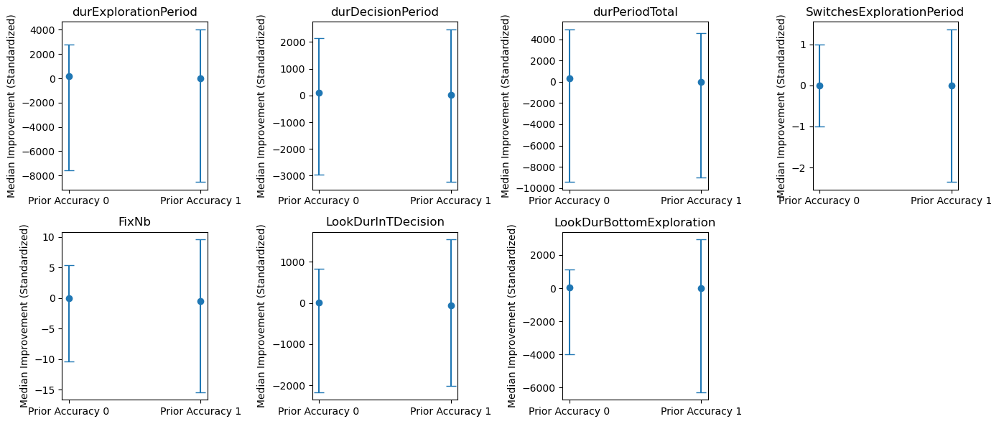

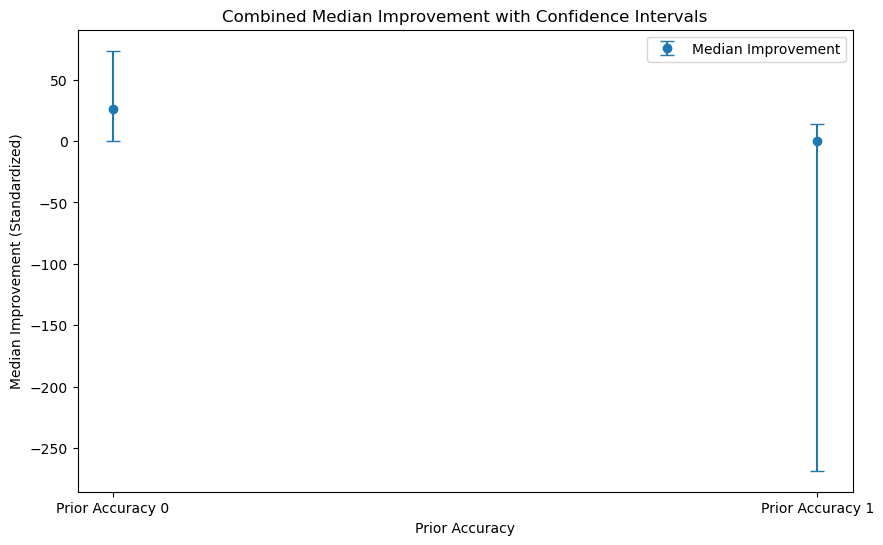

Variable: durExplorationPeriod
  Prior Accuracy = 0: Median Improvement = 167.0, Mean Improvement = 199.73324348607363
  Prior Accuracy = 1: Median Improvement = 0.0, Mean Improvement = 327.69021203155813

Variable: durDecisionPeriod
  Prior Accuracy = 0: Median Improvement = 92.0, Mean Improvement = 283.13147648996704
  Prior Accuracy = 1: Median Improvement = 16.5, Mean Improvement = -131.3544366957828

Variable: durPeriodTotal
  Prior Accuracy = 0: Median Improvement = 317.0, Mean Improvement = 482.8647199760409
  Prior Accuracy = 1: Median Improvement = -22.5, Mean Improvement = 196.33577533577534

Variable: SwitchesExplorationPeriod
  Prior Accuracy = 0: Median Improvement = 0.0, Mean Improvement = 0.04967804731955678
  Prior Accuracy = 1: Median Improvement = 0.0, Mean Improvement = 0.006780665915281314

Variable: FixNb
  Prior Accuracy = 0: Median Improvement = 0.0, Mean Improvement = 0.8053234501347709
  Prior Accuracy = 1: Median Improvement = -0.5, Mean Improvement = 0.493078

In [16]:
# Check, in general, if sessions tend to improve for each variable depending on prior accuracy
# Perform Kurskal-Wallis test for each variable.
variables = [
    'durExplorationPeriod',
    'durDecisionPeriod',
    'durPeriodTotal',
    'SwitchesExplorationPeriod',
    'FixNb',
    'LookDurInTDecision',
    'LookDurBottomExploration'
]

improvement_0_medians = []
improvement_1_medians = []
improvement_0_means = []
improvement_1_means = []

confidence_level = 0.95

# Plots
plt.figure(figsize=(14, 6))

for i, variable in enumerate(variables, start=1):
    data[f'{variable}_diff'] = data.groupby('session')[variable].diff()

    median_diff_per_session_0 = data[data['prior_accuracy'] == 0].groupby('session')[f'{variable}_diff'].median()
    median_diff_per_session_1 = data[data['prior_accuracy'] == 1].groupby('session')[f'{variable}_diff'].median()

    mean_diff_per_session_0 = data[data['prior_accuracy'] == 0].groupby('session')[f'{variable}_diff'].mean()
    mean_diff_per_session_1 = data[data['prior_accuracy'] == 1].groupby('session')[f'{variable}_diff'].mean()

    improvement_0_median = np.median(median_diff_per_session_0)
    improvement_1_median = np.median(median_diff_per_session_1)
    improvement_0_mean = np.mean(mean_diff_per_session_0)
    improvement_1_mean = np.mean(mean_diff_per_session_1)
    
    improvement_0_medians.append(improvement_0_median)
    improvement_1_medians.append(improvement_1_median)
    improvement_0_means.append(improvement_0_mean)
    improvement_1_means.append(improvement_1_mean)

    _, p_value = kruskal(median_diff_per_session_0, median_diff_per_session_1)

    ci_0 = np.percentile(median_diff_per_session_0, [100 * (1 - confidence_level) / 2, 100 * (1 + confidence_level) / 2])
    ci_1 = np.percentile(median_diff_per_session_1, [100 * (1 - confidence_level) / 2, 100 * (1 + confidence_level) / 2])

    plt.subplot(2, 4, i)
    plt.errorbar(x=[0, 1], y=[improvement_0_median, improvement_1_median],
                 yerr=[[improvement_0_median - ci_0[0], ci_0[1] - improvement_0_median],
                       [improvement_1_median - ci_1[0], ci_1[1] - improvement_1_median]],
                 fmt='o', capsize=5)
    plt.title(variable)
    plt.xticks([0, 1], ['Prior Accuracy 0', 'Prior Accuracy 1'])
    plt.ylabel('Median Improvement (Standardized)')
    
plt.tight_layout()
plt.show()

# General plot 
plt.figure(figsize=(10, 6))

combined_median_0 = np.median(improvement_0_medians)
combined_median_1 = np.median(improvement_1_medians)
combined_mean_0 = np.mean(improvement_0_means)
combined_mean_1 = np.mean(improvement_1_means)
combined_ci_0 = np.percentile(improvement_0_medians, [100 * (1 - confidence_level) / 2, 100 * (1 + confidence_level) / 2])
combined_ci_1 = np.percentile(improvement_1_medians, [100 * (1 - confidence_level) / 2, 100 * (1 + confidence_level) / 2])

plt.errorbar(x=['Prior Accuracy 0', 'Prior Accuracy 1'], y=[combined_median_0, combined_median_1],
             yerr=[[combined_median_0 - combined_ci_0[0], combined_ci_0[1] - combined_median_0],
                   [combined_median_1 - combined_ci_1[0], combined_ci_1[1] - combined_median_1]],
             fmt='o', capsize=5, label='Median Improvement')
plt.xlabel('Prior Accuracy')
plt.ylabel('Median Improvement (Standardized)')
plt.title('Combined Median Improvement with Confidence Intervals')
plt.legend()
plt.show()

# Mean and median improvement
for variable, median_0, median_1, mean_0, mean_1 in zip(variables, improvement_0_medians, improvement_1_medians, improvement_0_means, improvement_1_means):
    print(f'Variable: {variable}')
    print(f'  Prior Accuracy = 0: Median Improvement = {median_0}, Mean Improvement = {mean_0}')
    print(f'  Prior Accuracy = 1: Median Improvement = {median_1}, Mean Improvement = {mean_1}')
    print()

In [14]:
#I want to cluster sessions and see if there's a general pattern of how different groups of babies behave depending on if the prior accuracy was 0 or 1. 
#for this, I created a df that contains information per session, instead of per trial

# Adding difference between consecutive trials for each variable to the original dataset
variables = [
    'durExplorationPeriod',
    'durDecisionPeriod',
    'durPeriodTotal',
    'SwitchesExplorationPeriod',
    'SwitchesDecisionPeriod',
    'FixNb',
    'FixNbInTDecision',
    'FixNbInLExploration',
    'FixNbInRExploration',
    'FixNbBottomExploration',
    'LookDurInTDecision',
    'LookDurInLExploration',
    'LookDurInRExploration',
    'LookDurBottomExploration'
]

for variable in variables:
    data[f'{variable}_diff'] = data.groupby('session')[variable].diff()
    
#Creating a new df with two rows per session: one per prior_accuracy value
data_prior_0 = data[data['prior_accuracy'] == 0].drop(columns=['trialno', 'difficulty', 'sideChosen', 'accuracy'])
data_prior_1 = data[data['prior_accuracy'] == 1].drop(columns=['trialno', 'difficulty', 'sideChosen', 'accuracy'])

session_data_prior_0 = data_prior_0.groupby('session').median().reset_index()
session_data_prior_1 = data_prior_1.groupby('session').median().reset_index()

session_data_prior_0['prior_accuracy'] = 0
session_data_prior_1['prior_accuracy'] = 1

session_data = pd.concat([session_data_prior_0, session_data_prior_1], ignore_index=True)

session_data = session_data[['session', 'prior_accuracy'] + [col for col in session_data.columns if col not in ['session', 'prior_accuracy']]]

session_data.sort_values(by=['session', 'prior_accuracy'], inplace=True)

# Pivoting the dataset
pivoted_data = session_data.pivot(index='session', columns='prior_accuracy')

pivoted_data.columns = [f'{col[0]}_{int(col[1])}' for col in pivoted_data.columns]

pivoted_data.reset_index(inplace=True)

pivoted_data

,session,durExplorationPeriod_0,durExplorationPeriod_1,durDecisionPeriod_0,durDecisionPeriod_1,durPeriodTotal_0,durPeriodTotal_1,SwitchesExplorationPeriod_0,SwitchesExplorationPeriod_1,SwitchesDecisionPeriod_0,...,FixNbBottomExploration_diff_0,FixNbBottomExploration_diff_1,LookDurInTDecision_diff_0,LookDurInTDecision_diff_1,LookDurInLExploration_diff_0,LookDurInLExploration_diff_1,LookDurInRExploration_diff_0,LookDurInRExploration_diff_1,LookDurBottomExploration_diff_0,LookDurBottomExploration_diff_1
0,curE002a,3590.0,5326.0,2866.0,1582.0,8063.0,6926.0,2.5,3.0,1.0,...,-5.0,-1.0,1261.0,-392.0,-1646.0,-170.0,164.0,-124.0,-1296.0,-216.0
1,curE004a,5076.0,3682.0,2732.0,1418.0,9978.0,5308.0,2.0,2.0,1.0,...,3.0,-4.0,1732.0,-264.0,40.0,-378.0,578.0,-448.0,1216.0,-1528.0
2,curE008a,5930.0,7480.0,4116.0,5500.0,8930.0,13062.0,1.0,3.0,0.0,...,-5.0,-2.0,-1452.0,1670.0,-1316.0,604.0,-1872.0,1342.0,-2812.0,876.0
3,curE009a,5046.0,4476.0,2232.0,3232.0,7880.0,11908.0,2.0,2.0,1.0,...,-3.0,1.0,338.0,546.0,592.0,-208.0,-578.0,6.0,-1070.0,390.0
4,curE011a,3014.0,4448.0,2000.0,1816.0,5446.0,7114.0,1.0,2.0,0.0,...,-11.0,1.0,286.0,-194.0,-1816.0,-156.0,-2272.0,156.0,-4800.0,-300.0
5,curE012a,4664.0,3782.0,1504.0,1962.0,6568.0,6098.0,2.0,2.0,1.0,...,2.0,-2.0,142.0,-178.0,808.0,-1054.0,100.0,0.0,244.0,-326.0
6,curE013a,8838.0,4298.0,1192.0,1182.0,10354.0,6130.0,4.0,3.0,0.0,...,4.0,-3.0,-214.0,-54.0,610.0,-310.0,1118.0,-490.0,1979.0,-1026.0
7,curE014a,7870.0,NaN,5172.0,NaN,13328.0,NaN,2.0,NaN,0.0,...,-2.5,NaN,1205.0,NaN,-1560.0,NaN,-862.0,NaN,-1397.0,NaN
8,curE017a,4021.0,4248.0,1800.0,2791.0,5790.0,10802.0,1.5,1.0,0.0,...,-1.5,0.0,-540.0,231.0,-886.0,1160.0,720.0,-229.0,-191.0,-263.0
9,curE018a,3640.0,3980.0,1873.0,2100.0,6322.0,6178.0,2.0,2.0,0.0,...,-1.5,-2.0,-51.0,30.0,924.0,-626.0,-626.0,98.0,-81.0,-60.0


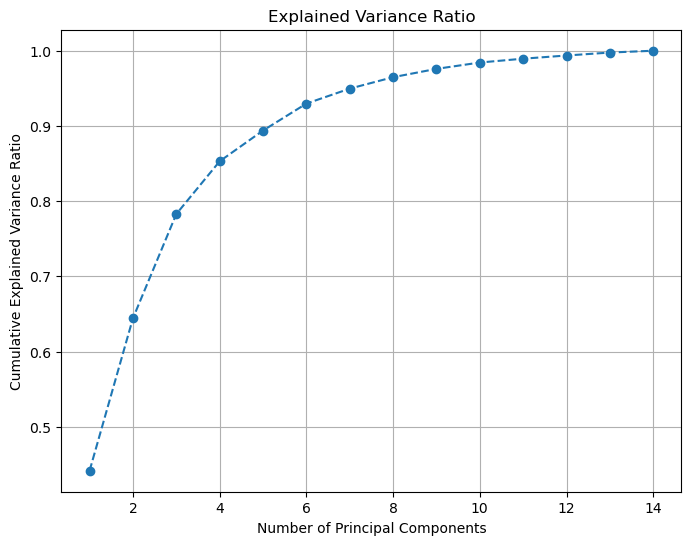

C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks t

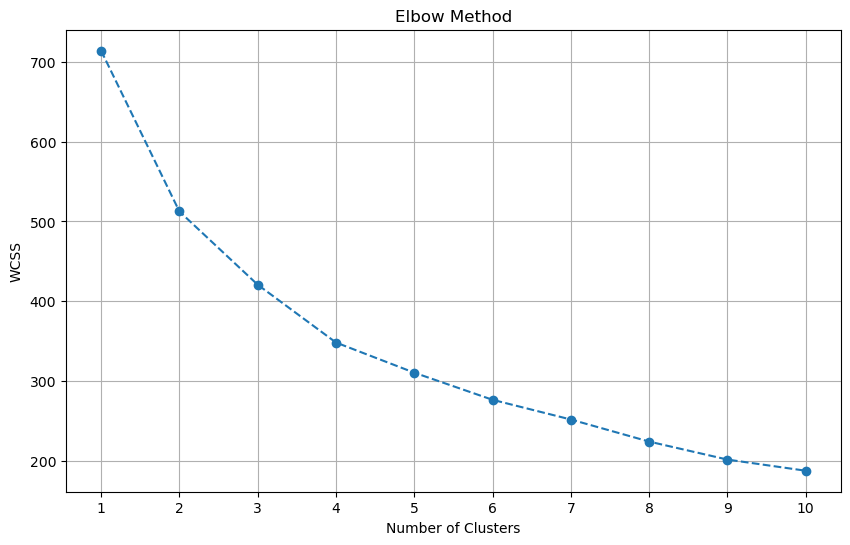

C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a fu

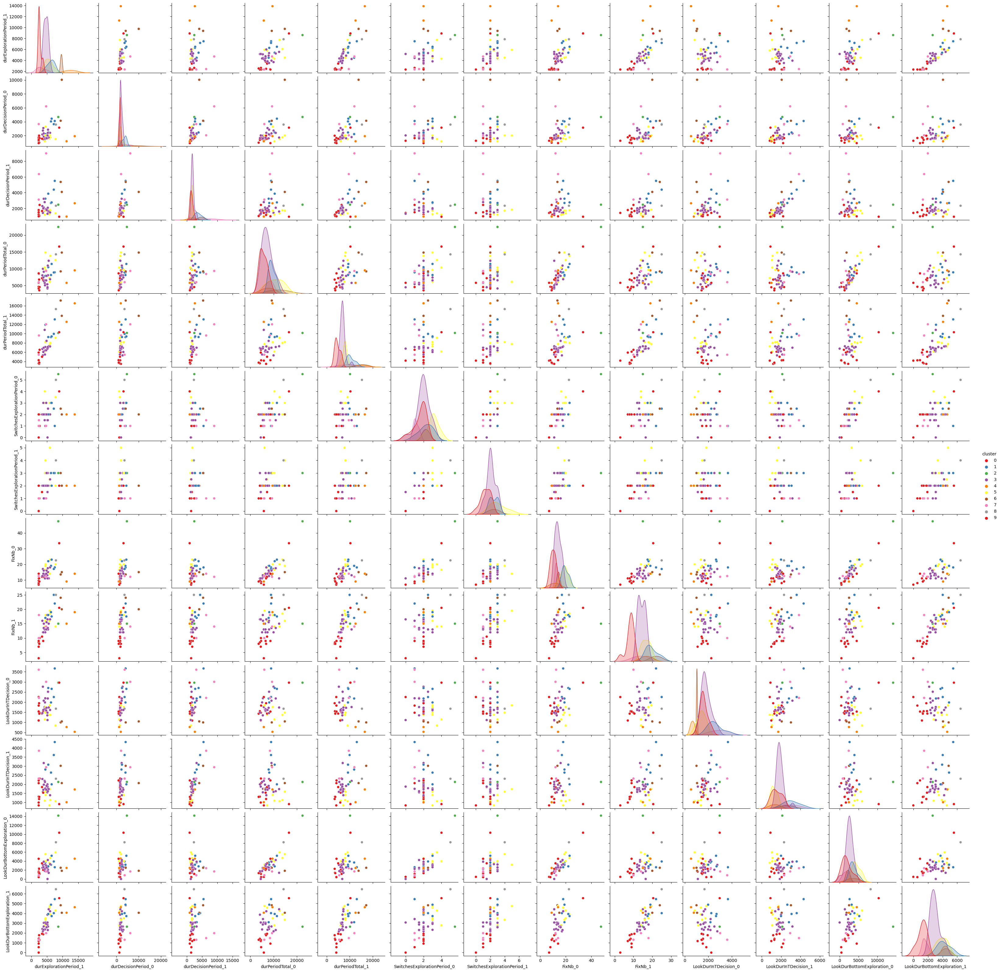

Cluster Centroids:
   durExplorationPeriod_0  durExplorationPeriod_1  durDecisionPeriod_0  \
0            -4169.885444             3221.711550          3292.992408   
1            11552.297993             9771.682526          3068.415777   
2            30730.367092            -2290.335618          9409.540540   
3             2831.671247             5016.094572          2104.199234   
4             9888.761728             5108.631696         -2348.010651   
5             9979.683255             1214.601523          1447.347193   
6            15987.919092            12229.999607           146.472619   
7             2035.224674            13367.198863          5792.875600   
8            25017.343516             3989.207393           506.673281   
9            23409.454977             -874.854582          4821.800156   

   durDecisionPeriod_1  durPeriodTotal_0  durPeriodTotal_1  \
0          2883.143732       8523.023563       7175.478972   
1          1114.615265       7480.564921  

In [15]:
# Attempting to cluster babies based on their exploratory behaviours per prior_accuracy

pivoted_data = pivoted_data.dropna()

pivoted_data = pivoted_data[pivoted_data['session'] != 'curE058a']

features_clustering = ['durExplorationPeriod_0', 'durExplorationPeriod_1', 'durDecisionPeriod_0', 'durDecisionPeriod_1', 'durPeriodTotal_0', 'durPeriodTotal_1', 'SwitchesExplorationPeriod_0', 'SwitchesExplorationPeriod_1', 'FixNb_0', 'FixNb_1', 'LookDurInTDecision_0', 'LookDurInTDecision_1', 'LookDurBottomExploration_0', 'LookDurBottomExploration_1']
X_clustering = pivoted_data[features_clustering]

# PCA
scaler = StandardScaler()
X_clustering_scaled = scaler.fit_transform(X_clustering)

pca = PCA()
X_pca = pca.fit_transform(X_clustering_scaled)

# Explained variance ratio
plt.figure(figsize=(8, 6))
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), np.cumsum(pca.explained_variance_ratio_), marker='o', linestyle='--')
plt.title('Explained Variance Ratio')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.grid(True)
plt.show()

# Elbow method
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(X_pca)
    wcss.append(kmeans.inertia_)

plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), wcss, marker='o', linestyle='--')
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.xticks(range(1, 11))
plt.grid(True)
plt.show()

num_clusters = 10  

# K-means clustering
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
clusters = kmeans.fit_predict(X_pca)

pivoted_data['cluster'] = clusters

sns.pairplot(pivoted_data, vars=features_clustering[1:], hue='cluster', palette='Set1')
plt.show()

cluster_centers = scaler.inverse_transform(kmeans.cluster_centers_)
cluster_centers_df = pd.DataFrame(cluster_centers, columns=X_clustering.columns)
print("Cluster Centroids:")
print(cluster_centers_df)

for cluster_id, cluster_group in pivoted_data.groupby('cluster'):
    print(f"Cluster {cluster_id}:")
    print(cluster_group['session'].values)

In [26]:
#Mixed effects model: HIERARCHICAL - Including sessions cluster 0
# Method: REML
# Variables included: ['durExplorationPeriod_0', 'durExplorationPeriod_1', 'durDecisionPeriod_0', 'durDecisionPeriod_1', 'durPeriodTotal_0', 'durPeriodTotal_1', 'SwitchesExplorationPeriod_0', 'SwitchesExplorationPeriod_1', 'FixNb_0', 'FixNb_1', 'LookDurInTDecision_0', 'LookDurInTDecision_1', 'LookDurBottomExploration_0', 'LookDurBottomExploration_1']

warnings.filterwarnings("ignore")

selected_sessions = ['curE012a', 'curE027a', 'curE030a', 'curE038a', 'curE050a', 'curE055a', 'curE056a', 'curE078a', 'curE080a', 'curE113a']
data_selected = data[data['session'].isin(selected_sessions)].copy()

data_selected['prior_accuracy'] = data_selected['prior_accuracy'].astype('category').cat.codes
data_selected['session'] = data_selected['session'].astype('category').cat.codes

# Standardize the selected features
scaler = StandardScaler()
data_selected[['durExplorationPeriod', 'durDecisionPeriod', 'durPeriodTotal', 'SwitchesExplorationPeriod', 'FixNb', 'LookDurInTDecision', 'LookDurInTDecision', 'LookDurBottomExploration', 'LookDurBottomExploration']]

# Mixed effects model
formula = 'prior_accuracy ~ durExplorationPeriod + durDecisionPeriod + SwitchesExplorationPeriod + FixNb + LookDurInTDecision + LookDurBottomExploration + (1 | session)'

mixed_model = smf.mixedlm(formula, data_selected, groups=data_selected['session'])
result = mixed_model.fit()

print(result.summary())

# Leave-One-Out Cross-Validation (LOO-CV)
loo = LeaveOneOut()
predictions = []
true_values = []

#print("\nPredicted vs Observed:")

for train_index, test_index in loo.split(data_selected):
    train_data = data_selected.iloc[train_index]
    test_data = data_selected.iloc[test_index]
    
    mixed_model = smf.mixedlm(formula, train_data, groups=train_data['session'])
    result = mixed_model.fit()
    
    if len(test_data) > 0:
        test_predictions = result.predict(test_data)
    
        true_values.extend(test_data['prior_accuracy'])
        predictions.extend(test_predictions)
        
        #print("Observed:", test_data['prior_accuracy'].iloc[0], "| Predicted:", test_predictions.iloc[0])

# Mean Absolute Error (MAE)
mae = mean_absolute_error(true_values, predictions)
print("\nMean Absolute Error:", mae)

               Mixed Linear Model Regression Results
Model:                MixedLM   Dependent Variable:   prior_accuracy
No. Observations:     194       Method:               REML          
No. Groups:           10        Scale:                0.6204        
Min. group size:      8         Log-Likelihood:       -271.3764     
Max. group size:      40        Converged:            Yes           
Mean group size:      19.4                                          
--------------------------------------------------------------------
                          Coef.  Std.Err.   z    P>|z| [0.025 0.975]
--------------------------------------------------------------------
Intercept                  0.505    0.197  2.568 0.010  0.120  0.891
durExplorationPeriod      -0.000    0.000 -0.042 0.966 -0.000  0.000
durDecisionPeriod          0.000    0.000  0.224 0.823 -0.000  0.000
SwitchesExplorationPeriod -0.037    0.077 -0.488 0.625 -0.187  0.113
FixNb                     -0.045    0.032 -1.427 0

In [32]:
#Mixed effects model: HIERARCHICAL - Including sessions cluster 3
# Method: REML
# Variables included: ['durExplorationPeriod_0', 'durExplorationPeriod_1', 'durDecisionPeriod_0', 'durDecisionPeriod_1', 'durPeriodTotal_0', 'durPeriodTotal_1', 'SwitchesExplorationPeriod_0', 'SwitchesExplorationPeriod_1', 'FixNb_0', 'FixNb_1', 'LookDurInTDecision_0', 'LookDurInTDecision_1', 'LookDurBottomExploration_0', 'LookDurBottomExploration_1']

warnings.filterwarnings("ignore")

selected_sessions = ['curE002a', 'curE004a', 'curE011a', 'curE017a', 'curE018a', 'curE046a', 'curE054a', 'curE066a', 'curE070a', 'curE074a', 'curE075a', 'curE082a', 'curE090a', 'curE092a', 'curE098a', 'curE104a', 'curE109a', 'curE112a']
data_selected = data[data['session'].isin(selected_sessions)].copy()

data_selected['prior_accuracy'] = data_selected['prior_accuracy'].astype('category').cat.codes
data_selected['session'] = data_selected['session'].astype('category').cat.codes

# Standardize the selected features
scaler = StandardScaler()
data_selected[['durExplorationPeriod', 'durDecisionPeriod', 'durPeriodTotal', 'SwitchesExplorationPeriod', 'FixNb', 'LookDurInTDecision', 'LookDurInTDecision', 'LookDurBottomExploration', 'LookDurBottomExploration']]

# Mixed effects model
formula = 'prior_accuracy ~ durExplorationPeriod + durDecisionPeriod + SwitchesExplorationPeriod + FixNb + LookDurInTDecision + LookDurBottomExploration + (1 | session)'

mixed_model = smf.mixedlm(formula, data_selected, groups=data_selected['session'])
result = mixed_model.fit()

print(result.summary())

# Leave-One-Out Cross-Validation (LOO-CV)
loo = LeaveOneOut()
predictions = []
true_values = []

#print("\nPredicted vs Observed:")

for train_index, test_index in loo.split(data_selected):
    train_data = data_selected.iloc[train_index]
    test_data = data_selected.iloc[test_index]
    
    mixed_model = smf.mixedlm(formula, train_data, groups=train_data['session'])
    result = mixed_model.fit()
    
    if len(test_data) > 0:
        test_predictions = result.predict(test_data)
    
        true_values.extend(test_data['prior_accuracy'])
        predictions.extend(test_predictions)
        
        #print("Observed:", test_data['prior_accuracy'].iloc[0], "| Predicted:", test_predictions.iloc[0])

# Mean Absolute Error (MAE)
mae = mean_absolute_error(true_values, predictions)
print("\nMean Absolute Error:", mae)

               Mixed Linear Model Regression Results
Model:                MixedLM   Dependent Variable:   prior_accuracy
No. Observations:     350       Method:               REML          
No. Groups:           18        Scale:                0.6501        
Min. group size:      10        Log-Likelihood:       -467.4270     
Max. group size:      36        Converged:            No            
Mean group size:      19.4                                          
--------------------------------------------------------------------
                          Coef.  Std.Err.   z    P>|z| [0.025 0.975]
--------------------------------------------------------------------
Intercept                  0.294    0.137  2.144 0.032  0.025  0.562
durExplorationPeriod      -0.000    0.000 -0.490 0.624 -0.000  0.000
durDecisionPeriod         -0.000    0.000 -0.256 0.798 -0.000  0.000
SwitchesExplorationPeriod -0.013    0.048 -0.275 0.783 -0.107  0.081
FixNb                     -0.017    0.016 -1.038 0

In [39]:
# Bayesian hierarchical regression model - Including sessions from cluster 0 
# Method of moments to estimate priors
# Variables included: durExplorationPeriod, durDecisionPeriod, SwitchesExplorationPeriod, FixNb, LookDurInTDecision, LookDurBottomExploration. 
#I am aware of the issue when tuning and sampling the model. I have tried to make it better (by increasing samples and retuning, as well as by using mean and std for priors, and trying different combinations of features.

selected_sessions = ['curE012a', 'curE027a', 'curE030a', 'curE038a', 'curE050a', 'curE055a', 'curE056a', 'curE078a', 'curE080a', 'curE113a']
filtered_data_selected = data[data['session'].isin(selected_sessions)].copy()

filtered_data_selected['session'] = filtered_data_selected['session'].astype('category').cat.codes

scaler = StandardScaler()
filtered_data_selected[['durExplorationPeriod', 'durDecisionPeriod', 'SwitchesExplorationPeriod', 'FixNb', 'LookDurInTDecision', 'LookDurBottomExploration']] = scaler.fit_transform(filtered_data_selected[['durExplorationPeriod', 'durDecisionPeriod', 'SwitchesExplorationPeriod', 'FixNb', 'LookDurInTDecision', 'LookDurBottomExploration']])

numeric_columns = filtered_data_selected.select_dtypes(include=['number']).columns
medians = filtered_data_selected[numeric_columns].median()
iqr = filtered_data_selected[numeric_columns].quantile(0.75) - filtered_data_selected[numeric_columns].quantile(0.25)

with pm.Model() as hierarchical_model:
    beta0 = pm.Normal('beta0', mu=medians['prior_accuracy'], sigma=iqr['prior_accuracy'] / 1.349)  # Scaling IQR to approximate std
    beta1 = pm.Normal('beta1', mu=medians['durExplorationPeriod'], sigma=iqr['durExplorationPeriod'] / 1.349)
    beta2 = pm.Normal('beta2', mu=medians['durDecisionPeriod'], sigma=iqr['durDecisionPeriod'] / 1.349)
    beta3 = pm.Normal('beta3', mu=medians['SwitchesExplorationPeriod'], sigma=iqr['SwitchesExplorationPeriod'] / 1.349)
    beta4 = pm.Normal('beta4', mu=medians['FixNb'], sigma=iqr['FixNb'] / 1.349)
    beta5 = pm.Normal('beta5', mu=medians['LookDurInTDecision'], sigma=iqr['LookDurInTDecision'] / 1.349)
    beta6 = pm.Normal('beta6', mu=medians['LookDurBottomExploration'], sigma=iqr['LookDurBottomExploration'] / 1.349)

    sigma_session = pm.Exponential('sigma_session', lam=1)

    mu_linear = beta0 + beta1 * filtered_data_selected['durExplorationPeriod'] + beta2 * filtered_data_selected['durDecisionPeriod'] + beta3 * filtered_data_selected['SwitchesExplorationPeriod'] + beta4 * filtered_data_selected['FixNb'] + beta5 * filtered_data_selected['LookDurInTDecision'] + beta6 * filtered_data_selected['LookDurBottomExploration']

    mu = pm.math.exp(mu_linear)

    sigma = pm.Exponential('sigma', lam=1)

    prior_accuracy = pm.Normal('prior_accuracy', mu=mu, sigma=sigma, observed=filtered_data_selected['prior_accuracy'])

    session_effects = pm.Normal('session_effects', mu=0, sigma=sigma_session, shape=len(filtered_data_selected['session'].unique()))

    mu += session_effects[filtered_data_selected['session'].values]

    trace = pm.sample(2000, tune=1000)

print(az.summary(trace, round_to=2))

feature_names = ['prior_accuracy', 'durExplorationPeriod', 'durDecisionPeriod', 'SwitchesExplorationPeriod', 'FixNb', 'LookDurInTDecision', 'LookDurBottomExploration']

summary = az.summary(trace, var_names=['beta0', 'beta1', 'beta2', 'beta3', 'beta4', 'beta5', 'beta6'], round_to=2)
for i, feature in enumerate(feature_names):
    print(f"Beta for {feature}: {summary['mean'][i]} +/- {summary['sd'][i]}")

beta0_samples = trace.posterior['beta0'].values
beta1_samples = trace.posterior['beta1'].values
beta2_samples = trace.posterior['beta2'].values
beta3_samples = trace.posterior['beta3'].values
beta4_samples = trace.posterior['beta4'].values
beta5_samples = trace.posterior['beta5'].values
beta6_samples = trace.posterior['beta6'].values

feature_importance = {
    'Beta for prior_accuracy': np.mean(beta0_samples),
    'Beta for durExplorationPeriod': np.mean(beta1_samples),
    'Beta for durDecisionPeriod': np.mean(beta2_samples),
    'Beta for SwitchesExplorationPeriod': np.mean(beta3_samples),
    'Beta for FixNb': np.mean(beta4_samples),
    'Beta for LookDurInTDecision': np.mean(beta5_samples),
    'Beta for LookDurBottomExploration': np.mean(beta6_samples)
}

print("Feature Importance:")
for feature, importance in feature_importance.items():
    print(f"{feature}: {importance}")

ppc = pm.sample_posterior_predictive(trace, var_names=['prior_accuracy', 'sigma'], model=hierarchical_model)

predicted_prior_accuracy = ppc['posterior_predictive']['prior_accuracy']

#predicted_summary = {
    #'mean_prior_accuracy': np.mean(predicted_prior_accuracy, axis=0),
    #'median_prior_accuracy': np.median(predicted_prior_accuracy, axis=0),
    #'lower_95_prior_accuracy': np.percentile(predicted_prior_accuracy, 2.5, axis=0),
    #'upper_95_prior_accuracy': np.percentile(predicted_prior_accuracy, 97.5, axis=0)
#}

#for stat, value in predicted_summary.items():
 #   print(f"{stat}: {value}")

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [beta0, beta1, beta2, beta3, beta4, beta5, beta6, sigma_session, sigma, prior_accuracy_unobserved, session_effects]


Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 98 seconds.
There were 253 divergences after tuning. Increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
Sampling: [prior_accuracy_observed, prior_accuracy_unobserved, sigma]


                     mean    sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  \
beta0               -0.76  0.12   -1.00    -0.55       0.00     0.00   
beta1               -0.13  0.24   -0.56     0.28       0.00     0.00   
beta2               -0.04  0.13   -0.28     0.19       0.00     0.00   
beta3                0.02  0.17   -0.30     0.34       0.00     0.00   
beta4               -0.07  0.24   -0.51     0.39       0.00     0.00   
...                   ...   ...     ...      ...        ...      ...   
prior_accuracy[189]  0.00  0.00    0.00     0.00       0.00     0.00   
prior_accuracy[190]  0.67  0.51   -0.31     1.59       0.01     0.01   
prior_accuracy[191]  1.00  0.00    1.00     1.00       0.00     0.00   
prior_accuracy[192]  0.51  0.51   -0.41     1.49       0.01     0.01   
prior_accuracy[193]  1.00  0.00    1.00     1.00       0.00     0.00   

                     ess_bulk  ess_tail  r_hat  
beta0                 2452.90   2668.17   1.00  
beta1                 2905.39   3049.

In [40]:
# Bayesian hierarchical regression model - Including sessions from cluster 3
# Method of moments to estimate priors
# Variables included: durExplorationPeriod, durDecisionPeriod, SwitchesExplorationPeriod, FixNb, LookDurInTDecision, LookDurBottomExploration. 
#I am aware of the issue when tuning and sampling the model. I have tried to make it better (by increasing samples and retuning, as well as by using mean and std for priors, and trying different combinations of features.

selected_sessions = ['curE002a', 'curE004a', 'curE011a', 'curE017a', 'curE018a', 'curE046a', 'curE054a', 'curE066a', 'curE070a', 'curE074a', 'curE075a', 'curE082a', 'curE090a', 'curE092a', 'curE098a', 'curE104a', 'curE109a', 'curE112a']
filtered_data_selected = data[data['session'].isin(selected_sessions)].copy()

filtered_data_selected['session'] = filtered_data_selected['session'].astype('category').cat.codes

scaler = StandardScaler()
filtered_data_selected[['durExplorationPeriod', 'durDecisionPeriod', 'SwitchesExplorationPeriod', 'FixNb', 'LookDurInTDecision', 'LookDurBottomExploration']] = scaler.fit_transform(filtered_data_selected[['durExplorationPeriod', 'durDecisionPeriod', 'SwitchesExplorationPeriod', 'FixNb', 'LookDurInTDecision', 'LookDurBottomExploration']])

numeric_columns = filtered_data_selected.select_dtypes(include=['number']).columns
medians = filtered_data_selected[numeric_columns].median()
iqr = filtered_data_selected[numeric_columns].quantile(0.75) - filtered_data_selected[numeric_columns].quantile(0.25)

with pm.Model() as hierarchical_model:
    beta0 = pm.Normal('beta0', mu=medians['prior_accuracy'], sigma=iqr['prior_accuracy'] / 1.349)  # Scaling IQR to approximate std
    beta1 = pm.Normal('beta1', mu=medians['durExplorationPeriod'], sigma=iqr['durExplorationPeriod'] / 1.349)
    beta2 = pm.Normal('beta2', mu=medians['durDecisionPeriod'], sigma=iqr['durDecisionPeriod'] / 1.349)
    beta3 = pm.Normal('beta3', mu=medians['SwitchesExplorationPeriod'], sigma=iqr['SwitchesExplorationPeriod'] / 1.349)
    beta4 = pm.Normal('beta4', mu=medians['FixNb'], sigma=iqr['FixNb'] / 1.349)
    beta5 = pm.Normal('beta5', mu=medians['LookDurInTDecision'], sigma=iqr['LookDurInTDecision'] / 1.349)
    beta6 = pm.Normal('beta6', mu=medians['LookDurBottomExploration'], sigma=iqr['LookDurBottomExploration'] / 1.349)
    
    sigma_session = pm.Exponential('sigma_session', lam=1)

    mu_linear = beta0 + beta1 * filtered_data_selected['durExplorationPeriod'] + beta2 * filtered_data_selected['durDecisionPeriod'] + beta3 * filtered_data_selected['SwitchesExplorationPeriod'] + beta4 * filtered_data_selected['FixNb'] + beta5 * filtered_data_selected['LookDurInTDecision'] + beta6 * filtered_data_selected['LookDurBottomExploration']

    mu = pm.math.exp(mu_linear)

    sigma = pm.Exponential('sigma', lam=1)
 
    prior_accuracy = pm.Normal('prior_accuracy', mu=mu, sigma=sigma, observed=filtered_data_selected['prior_accuracy'])

    session_effects = pm.Normal('session_effects', mu=0, sigma=sigma_session, shape=len(filtered_data_selected['session'].unique()))

    mu += session_effects[filtered_data_selected['session'].values]

    trace = pm.sample(2000, tune=1000)

print(az.summary(trace, round_to=2))

feature_names = ['prior_accuracy', 'durExplorationPeriod', 'durDecisionPeriod', 'SwitchesExplorationPeriod', 'FixNb', 'LookDurInTDecision', 'LookDurBottomExploration']

summary = az.summary(trace, var_names=['beta0', 'beta1', 'beta2', 'beta3', 'beta4', 'beta5', 'beta6'], round_to=2)
for i, feature in enumerate(feature_names):
    print(f"Beta for {feature}: {summary['mean'][i]} +/- {summary['sd'][i]}")

beta0_samples = trace.posterior['beta0'].values
beta1_samples = trace.posterior['beta1'].values
beta2_samples = trace.posterior['beta2'].values
beta3_samples = trace.posterior['beta3'].values
beta4_samples = trace.posterior['beta4'].values
beta5_samples = trace.posterior['beta5'].values
beta6_samples = trace.posterior['beta6'].values

feature_importance = {
    'Beta for prior_accuracy': np.mean(beta0_samples),
    'Beta for durExplorationPeriod': np.mean(beta1_samples),
    'Beta for durDecisionPeriod': np.mean(beta2_samples),
    'Beta for SwitchesExplorationPeriod': np.mean(beta3_samples),
    'Beta for FixNb': np.mean(beta4_samples),
    'Beta for LookDurInTDecision': np.mean(beta5_samples),
    'Beta for LookDurBottomExploration': np.mean(beta6_samples)
}

print("Feature Importance:")
for feature, importance in feature_importance.items():
    print(f"{feature}: {importance}")

ppc = pm.sample_posterior_predictive(trace, var_names=['prior_accuracy', 'sigma'], model=hierarchical_model)

predicted_prior_accuracy = ppc['posterior_predictive']['prior_accuracy']

#predicted_summary = {
    #'mean_prior_accuracy': np.mean(predicted_prior_accuracy, axis=0),
    #'median_prior_accuracy': np.median(predicted_prior_accuracy, axis=0),
    #'lower_95_prior_accuracy': np.percentile(predicted_prior_accuracy, 2.5, axis=0),
    #'upper_95_prior_accuracy': np.percentile(predicted_prior_accuracy, 97.5, axis=0)
#}

#for stat, value in predicted_summary.items():
 #   print(f"{stat}: {value}")

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [beta0, beta1, beta2, beta3, beta4, beta5, beta6, sigma_session, sigma, prior_accuracy_unobserved, session_effects]


Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 140 seconds.
There were 16 divergences after tuning. Increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
Sampling: [prior_accuracy_observed, prior_accuracy_unobserved, sigma]


                     mean    sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  \
beta0               -0.62  0.06   -0.73    -0.51       0.00      0.0   
beta1                0.01  0.11   -0.20     0.21       0.00      0.0   
beta2               -0.13  0.11   -0.34     0.06       0.00      0.0   
beta3                0.07  0.07   -0.07     0.20       0.00      0.0   
beta4               -0.07  0.15   -0.35     0.22       0.00      0.0   
...                   ...   ...     ...      ...        ...      ...   
prior_accuracy[345]  1.00  0.00    1.00     1.00       0.00      0.0   
prior_accuracy[346]  0.52  0.51   -0.41     1.50       0.01      0.0   
prior_accuracy[347]  0.00  0.00    0.00     0.00       0.00      0.0   
prior_accuracy[348]  0.56  0.51   -0.35     1.53       0.01      0.0   
prior_accuracy[349]  0.00  0.00    0.00     0.00       0.00      0.0   

                     ess_bulk  ess_tail  r_hat  
beta0                 5565.08   6280.19    1.0  
beta1                 5740.64   5088.

In [6]:
# Dataset with difference among variables trial by trial

variables = ['accuracy', 'durExplorationPeriod', 'durDecisionPeriod', 'durPeriodTotal',
             'SwitchesExplorationPeriod',   'SwitchesDecisionPeriod', 'NbSwitches', 'FixNb', 
             'FixNbInTDecision', 'FixNbInLExploration', 'FixNbInRExploration', 'FixNbBottomExploration',
             'LookDurInTDecision', 'LookDurInLExploration', 'LookDurInRExploration', 'LookDurBottomExploration']

for variable in variables:
    data[f'{variable}_improvement'] = (data.groupby('session')[variable]
                                      .diff()
                                      .where((data['trialno'].shift(1) == data['trialno'] - 1) |
                                             (data['trialno'].shift(-1) == data['trialno'] + 1) |
                                             (data['trialno'].shift(1).isna()) |
                                             (data['trialno'].shift(-1).isna()))
                                    )
    
for variable in variables:
    data.loc[data['trialno'] == 1, f'{variable}_improvement'] = pd.NA

data.head()

,session,trialno,difficulty,accuracy,sideChosen,durExplorationPeriod,durDecisionPeriod,durPeriodTotal,SwitchesExplorationPeriod,SwitchesDecisionPeriod,...,NbSwitches_improvement,FixNb_improvement,FixNbInTDecision_improvement,FixNbInLExploration_improvement,FixNbInRExploration_improvement,FixNbBottomExploration_improvement,LookDurInTDecision_improvement,LookDurInLExploration_improvement,LookDurInRExploration_improvement,LookDurBottomExploration_improvement
0,curE002a,8,Easy,0.0,left,11270,924,12194,6,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,curE002a,9,Easy,1.0,left,2498,2182,4680,2,0,...,-4.0,-12.0,2.0,-10.0,-3.0,-13.0,968.0,-3368.0,-442.0,-3810.0
2,curE002a,10,Easy,1.0,right,9912,2914,12826,3,1,...,2.0,7.0,0.0,0.0,3.0,3.0,-156.0,-282.0,1270.0,988.0
3,curE002a,11,Medium,1.0,right,2328,1582,3910,2,1,...,-1.0,-7.0,0.0,-1.0,-4.0,-5.0,-240.0,-170.0,-1494.0,-1664.0
4,curE002a,12,Medium,0.0,left,14272,984,15256,5,1,...,3.0,16.0,-2.0,12.0,6.0,18.0,-484.0,4270.0,2290.0,6560.0


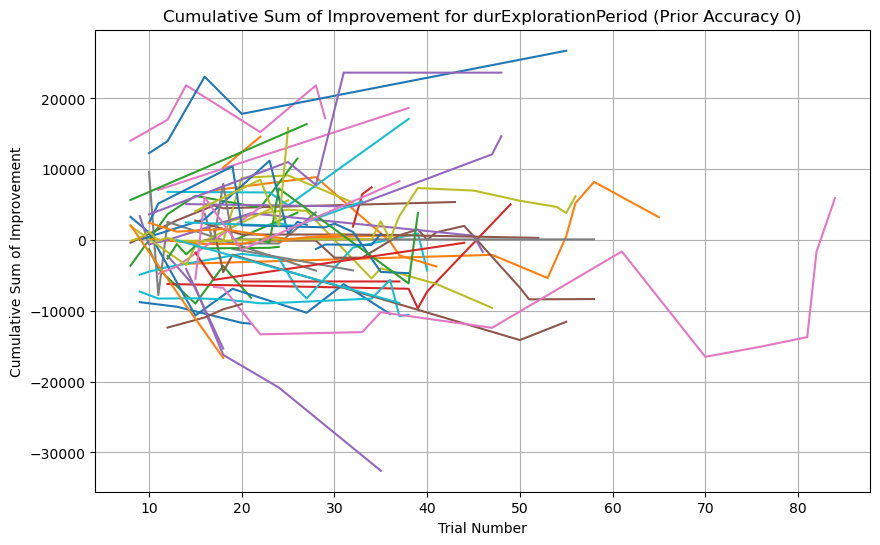

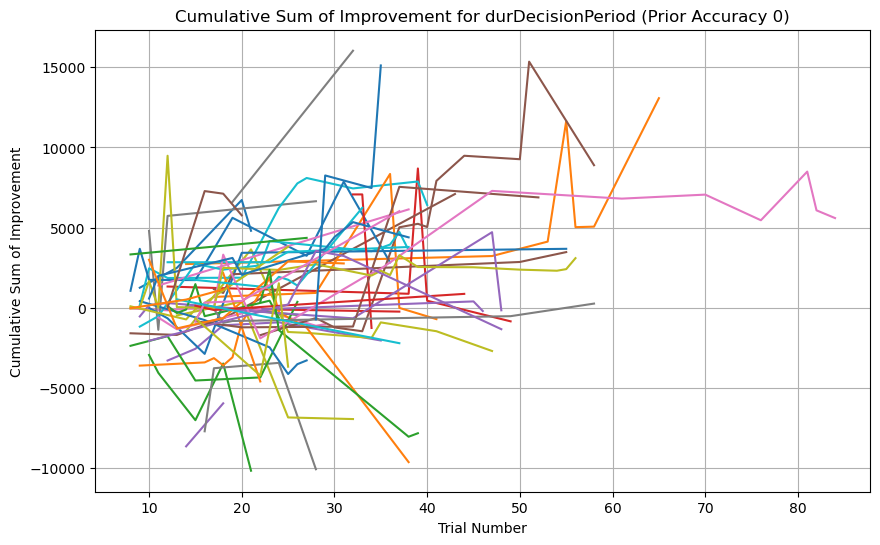

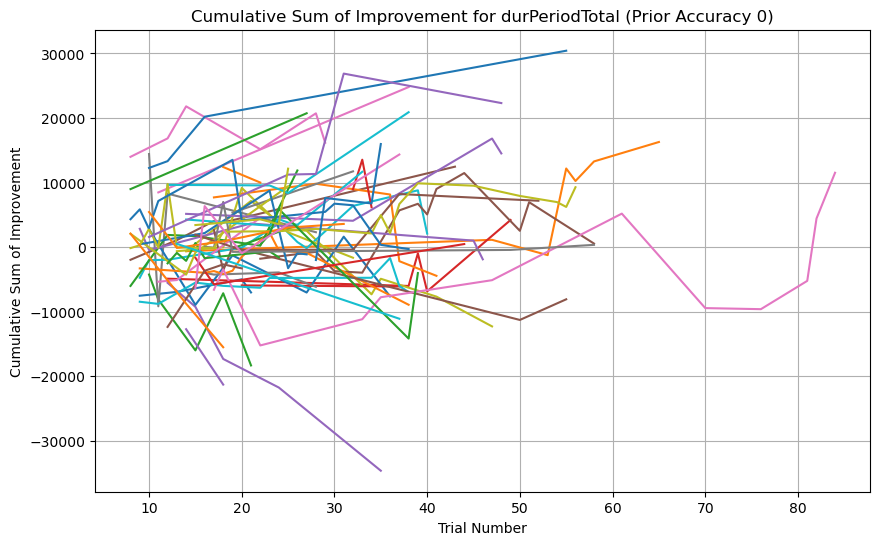

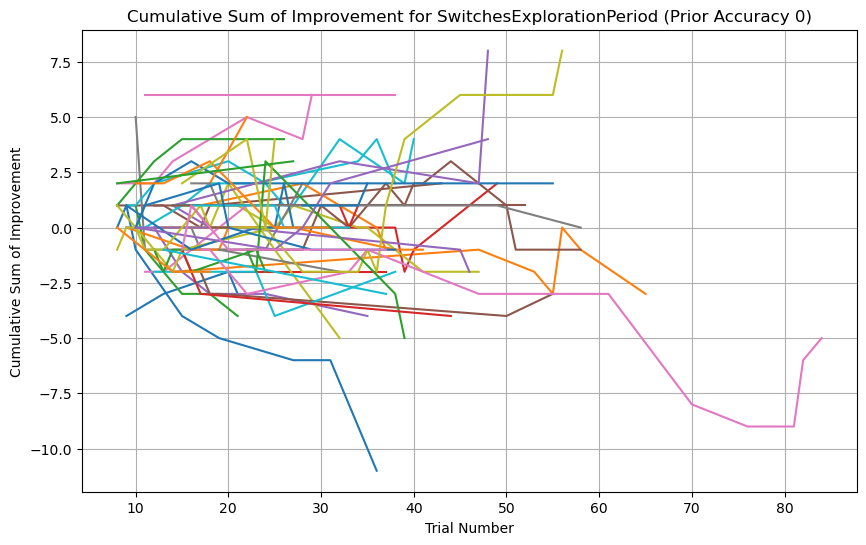

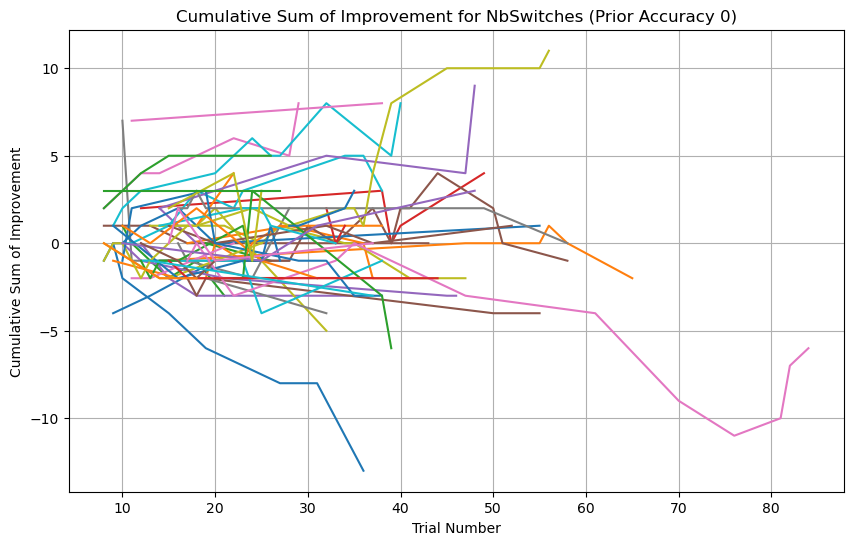

...

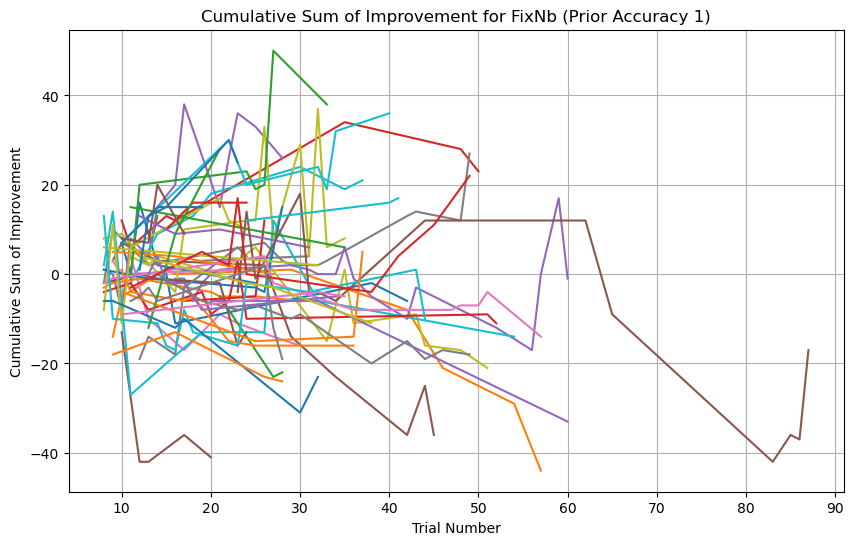

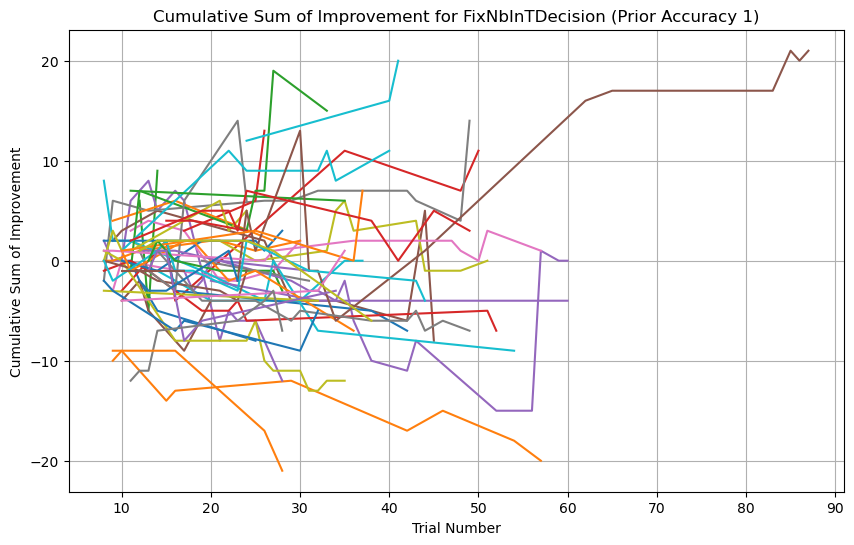

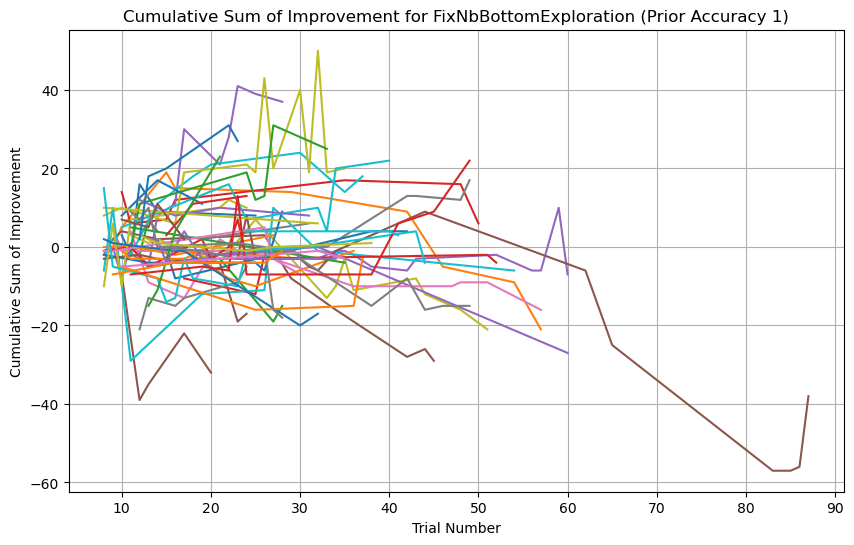

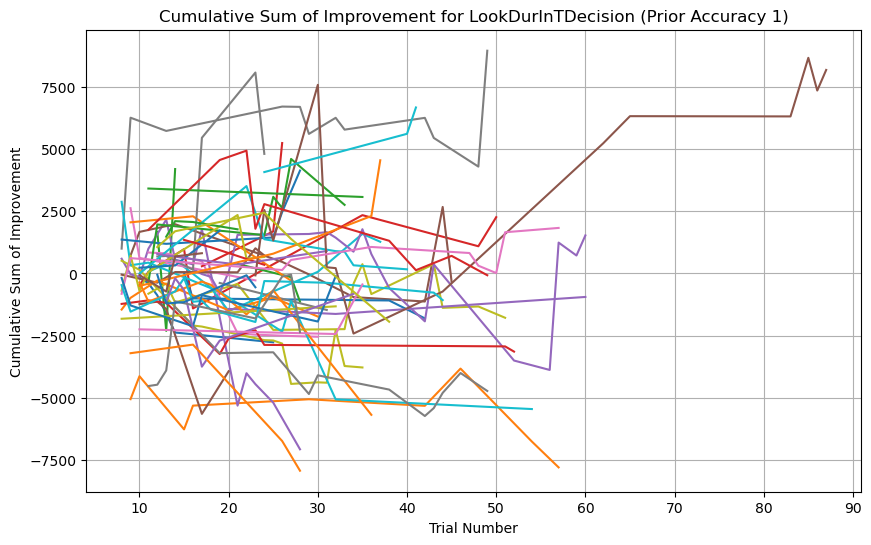

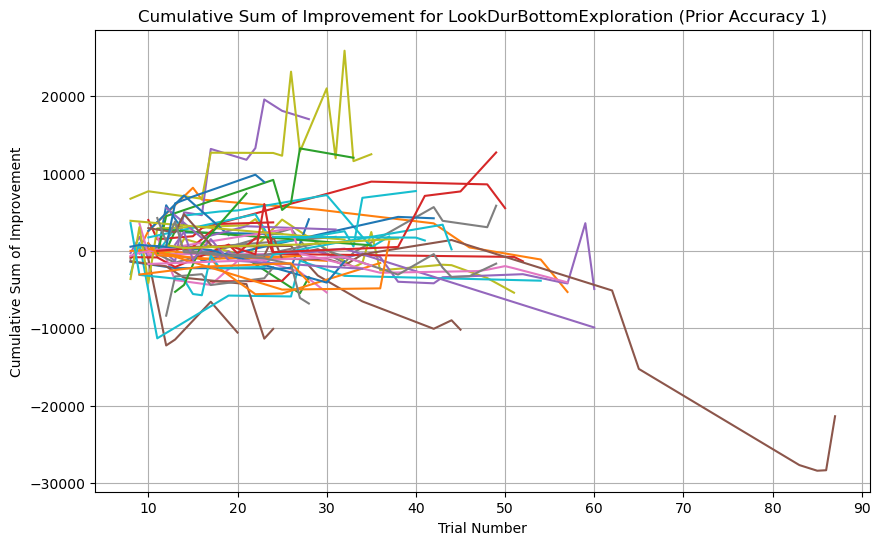

In [7]:
#Compute cumulative sum of improvements by prior accuracy

variables = ['durExplorationPeriod', 'durDecisionPeriod', 'durPeriodTotal',
                        'SwitchesExplorationPeriod', 'NbSwitches', 'FixNb', 
                        'FixNbInTDecision', 'FixNbBottomExploration',
                        'LookDurInTDecision','LookDurBottomExploration']

prior_accuracy_0 = data[data['prior_accuracy'] == 0]
prior_accuracy_1 = data[data['prior_accuracy'] == 1]

for variable in variables:
    plt.figure(figsize=(10, 6))
    for session, group in prior_accuracy_0.groupby('session'):
        plt.plot(group['trialno'], group[f'{variable}_improvement'].cumsum(), label=f'Session {session}')
    plt.title(f'Cumulative Sum of Improvement for {variable} (Prior Accuracy 0)')
    plt.xlabel('Trial Number')
    plt.ylabel('Cumulative Sum of Improvement')
    #plt.legend()
    plt.grid(True)
    plt.show()

for variable in variables:
    plt.figure(figsize=(10, 6))
    for session, group in prior_accuracy_1.groupby('session'):
        plt.plot(group['trialno'], group[f'{variable}_improvement'].cumsum(), label=f'Session {session}')
    plt.title(f'Cumulative Sum of Improvement for {variable} (Prior Accuracy 1)')
    plt.xlabel('Trial Number')
    plt.ylabel('Cumulative Sum of Improvement')
    #plt.legend()
    plt.grid(True)
    plt.show()

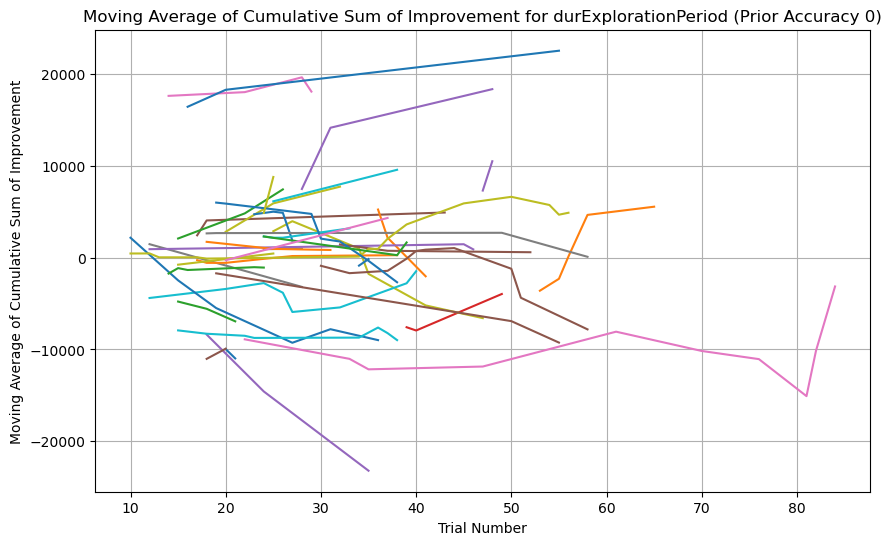

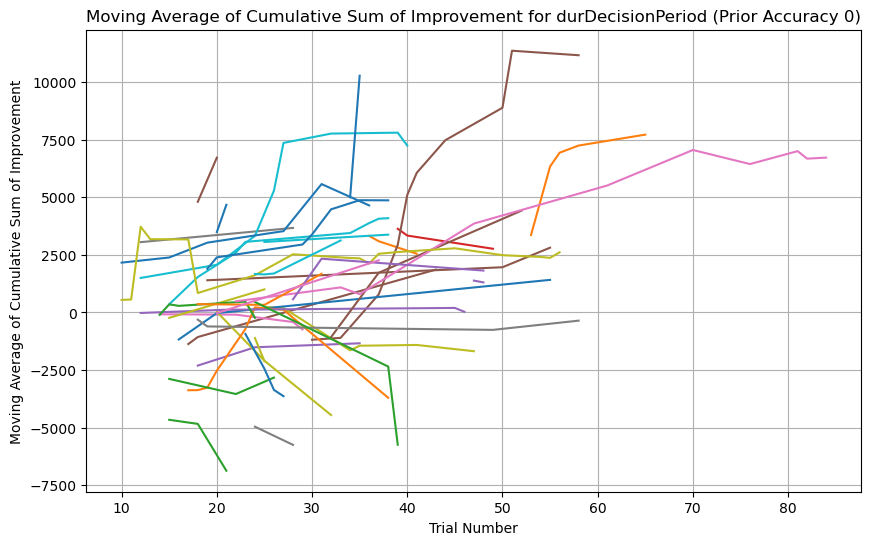

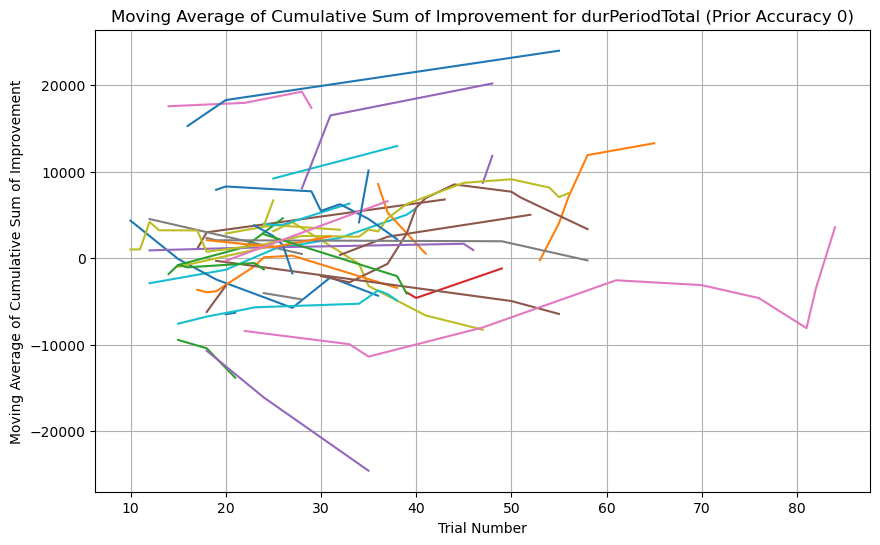

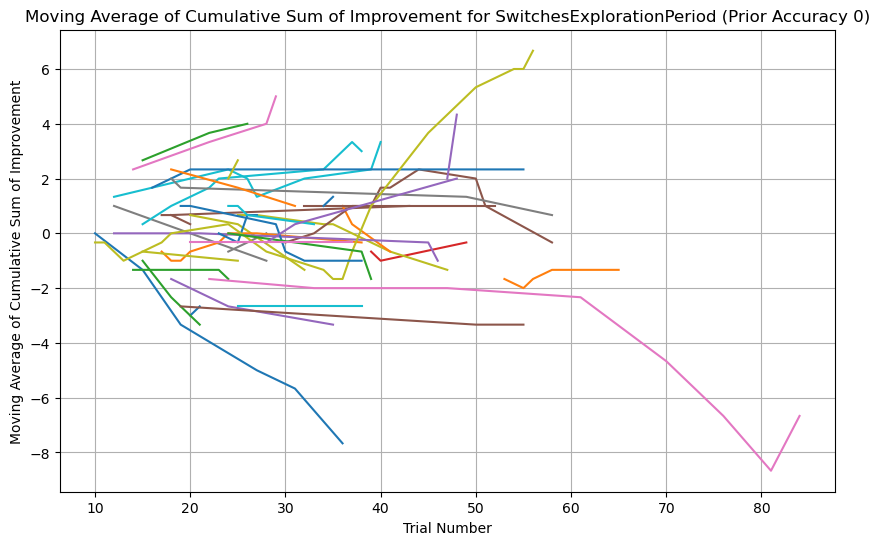

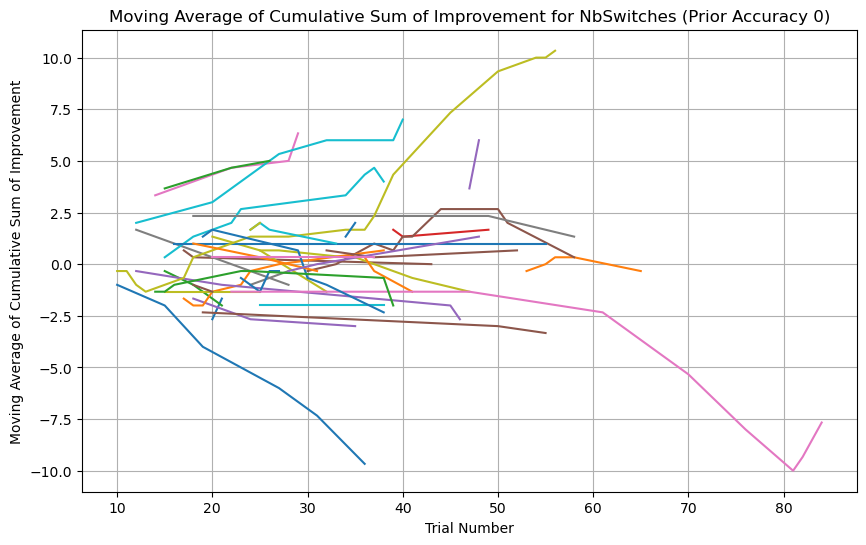

...

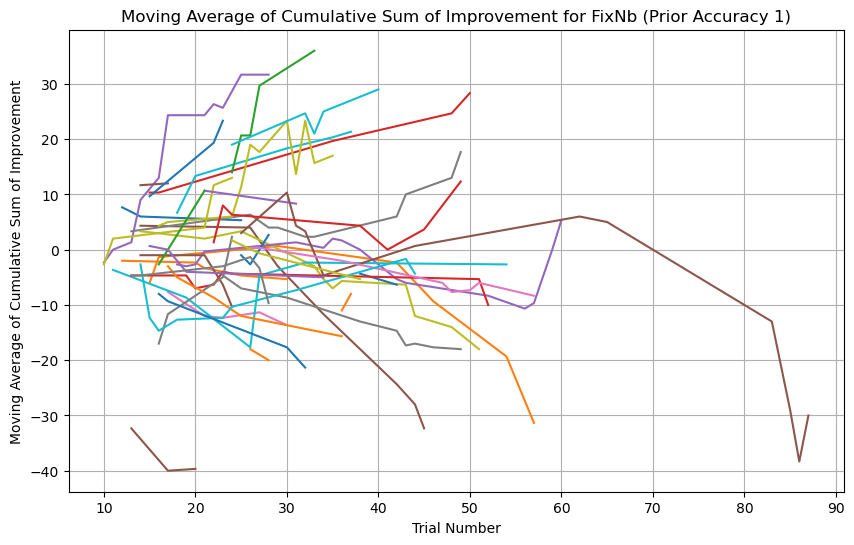

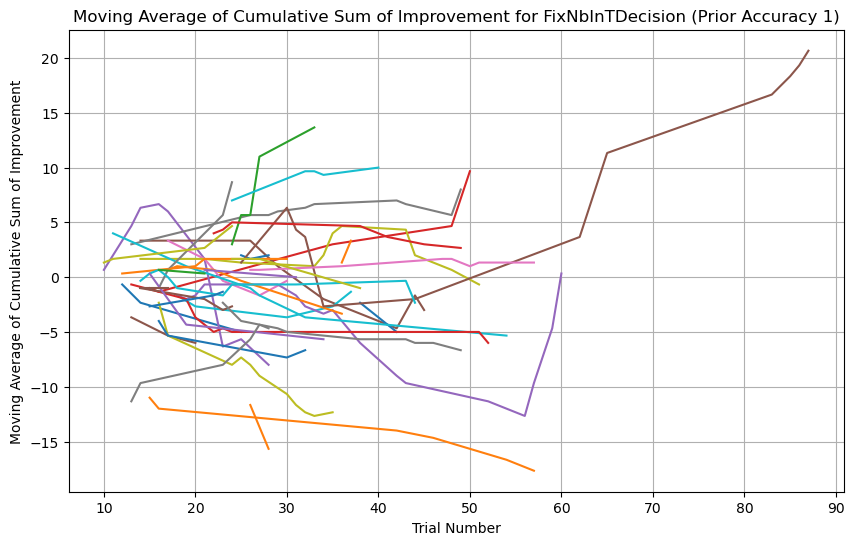

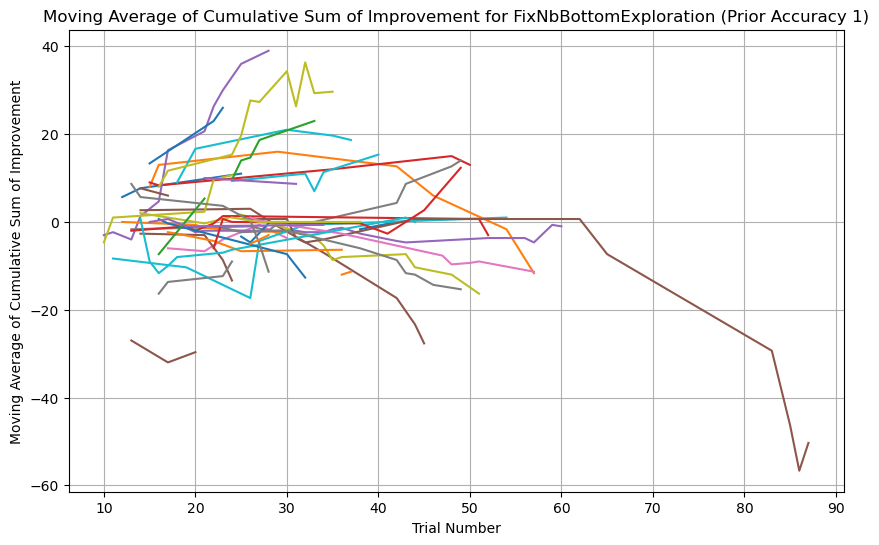

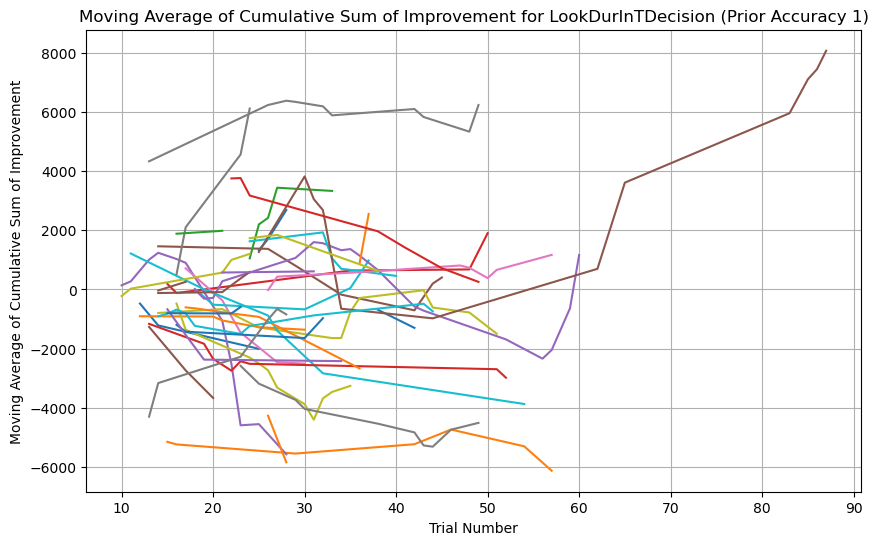

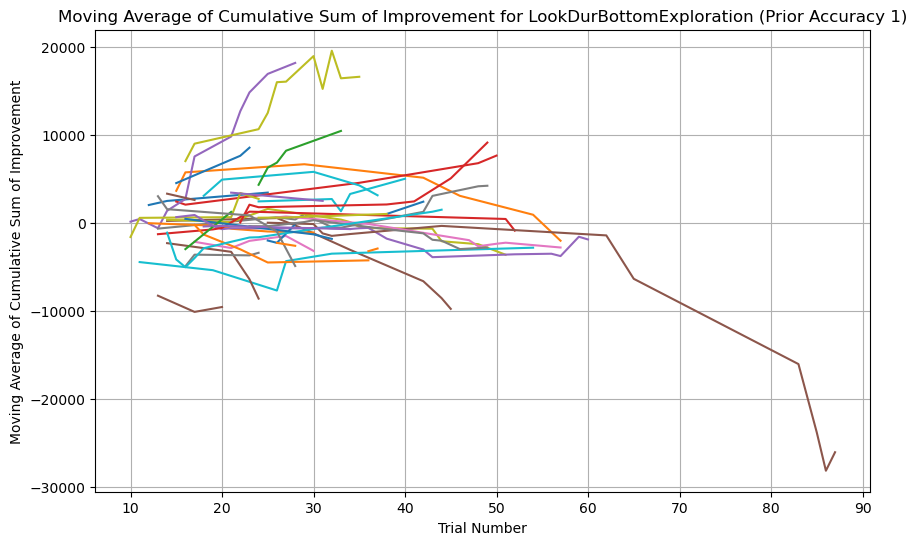

In [8]:
# Cumulative sum of improvements trial by trial by prior accuracy - moving average

window_size = 3  

for variable in variables:
    plt.figure(figsize=(10, 6))
    for session, group in prior_accuracy_0.groupby('session'):
        cum_sum = group[f'{variable}_improvement'].cumsum()
        moving_avg = cum_sum.rolling(window=window_size).mean()
        plt.plot(group['trialno'], moving_avg, label=f'Session {session}')
    plt.title(f'Moving Average of Cumulative Sum of Improvement for {variable} (Prior Accuracy 0)')
    plt.xlabel('Trial Number')
    plt.ylabel('Moving Average of Cumulative Sum of Improvement')
    plt.grid(True)
    plt.show()

for variable in variables:
    plt.figure(figsize=(10, 6))
    for session, group in prior_accuracy_1.groupby('session'):
        cum_sum = group[f'{variable}_improvement'].cumsum()
        moving_avg = cum_sum.rolling(window=window_size).mean()
        plt.plot(group['trialno'], moving_avg, label=f'Session {session}')
    plt.title(f'Moving Average of Cumulative Sum of Improvement for {variable} (Prior Accuracy 1)')
    plt.xlabel('Trial Number')
    plt.ylabel('Moving Average of Cumulative Sum of Improvement')
    plt.grid(True)
    plt.show()